In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import sys
sys.path.append('/content/drive/MyDrive/Dataset/vision/references/detection')

from engine import train_one_epoch, evaluate
import utils
import transforms as T


In [ ]:
import numpy as np
import pandas as pd
import os
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
import torch
import torchvision
from torchvision import transforms as torchtrans
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from xml.etree import ElementTree as et
import warnings
warnings.filterwarnings('ignore')

In [ ]:
positive = "/content/drive/MyDrive/Dataset/NWPU VHR-10 dataset/positive image set"
negative = "/content/drive/MyDrive/Dataset/NWPU VHR-10 dataset/negative image set"
box = "/content/drive/MyDrive/Dataset/NWPU VHR-10 dataset/ground truth"

In [ ]:
def read_ground_truth_annotations():

        dir = "/content/drive/MyDrive/Dataset/NWPU VHR-10 dataset/ground truth"

        file_names = []
        box_data = []
        class_data = []

        for file_name in os.listdir(dir):
            file_path = os.path.join(dir, file_name)

            if os.path.isfile(file_path):
                name_without_extension = os.path.splitext(file_name)[0]
                with open(file_path, 'r') as f:
                    file_content = f.read()
                    file_names.append(name_without_extension)
                    lignes = file_content.strip().split('\n')
                    boxes = []
                    classes = []
                    for ligne in lignes:
                        elements = ligne.split(',')
                        box = [int(elem.strip("() ")) for elem in elements[:4]]
                        classe = int(elements[4])
                        boxes.append(box)
                        classes.append(classe)
                    box_data.append(boxes)
                    class_data.append(classes)

        return(file_names,box_data,class_data)


In [ ]:
class ImagesDataset(torch.utils.data.Dataset):

    def __init__(self, files_dir, width, height,ID,CLASS,BOX, transforms=None):
        self.transforms = transforms
        self.files_dir = positive
        self.bbox_dir= box
        self.height = height
        self.width = width
        self.imgs = ID
        self.box=BOX
        self.Class=CLASS


        self.classes= [_,1,2,3,4,5,6,7,8,9,10]
    def __getitem__(self, idx):
        img_name = self.imgs[idx]
        image_path = os.path.join(self.files_dir, img_name +'.jpg')


        img = cv2.imread(image_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
        img_res = cv2.resize(img_rgb, (self.width, self.height), cv2.INTER_AREA)

        img_res /= 255.0


        annot_filename = img_name + '.txt'
        annot_file_path = os.path.join(self.bbox_dir, annot_filename)
        bb=[]

        wt = img.shape[1]
        ht = img.shape[0]

        bbox=self.box[idx]
        for box in bbox:
            xmin_corr = (box[0]/wt)*self.width
            xmax_corr = (box[2]/wt)*self.width
            ymin_corr = (box[1]/ht)*self.height
            ymax_corr = (box[3]/ht)*self.height
            bb.append([xmin_corr, ymin_corr, xmax_corr, ymax_corr])
        boxes = torch.as_tensor(bb, dtype=torch.float32)

        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])

        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)

        labels = torch.as_tensor(self.Class[idx], dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd

        image_id=idx

        target["image_id"] = image_id


        if self.transforms:

            sample = self.transforms(image = img_res,
                                     bboxes = target['boxes'],
                                     labels = labels.view(-1))

            img_res = sample['image']

            target['boxes'] = torch.Tensor(sample['bboxes'])
            target["labels"] = labels.view(-1)

        return torch.tensor(img_res), target

    def __len__(self):
        return len(self.imgs)



In [ ]:
def loadImg(dir,img_name):
    image_path = os.path.join(dir, img_name)


    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
    img_res = cv2.resize(img_rgb, (1024,1024 ), cv2.INTER_AREA)
    img_res /= 255.0
    return img_res

## **Data Augmentation**

In [ ]:
def generate_transformations(train):

    if train:
        return A.Compose([
                            A.HorizontalFlip(0.5),

                            ToTensorV2(p=1.0)
                        ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})
    else:
        return A.Compose([
                            ToTensorV2(p=1.0)
                        ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})

In [ ]:
ID,BOX,CLASS=read_ground_truth_annotations()


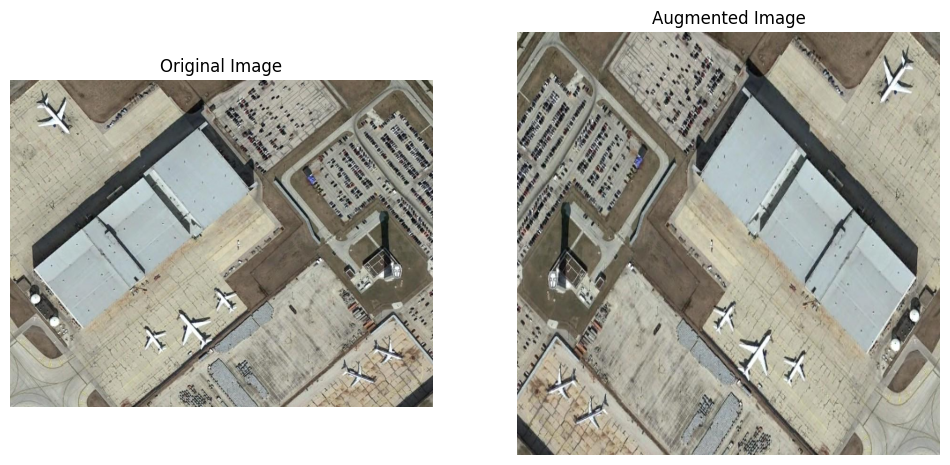

In [ ]:


positive_dataset = ImagesDataset(positive, width=480, height=480, ID=ID, CLASS=CLASS, BOX=BOX, transforms=None)
augmented_dataset = ImagesDataset(positive, width=480, height=480, ID=ID, CLASS=CLASS, BOX=BOX, transforms=generate_transformations(train=True))

idx = random.randint(0, len(positive_dataset) - 1)


original_img = cv2.imread(os.path.join(positive, ID[idx] + '.jpg'))
augmented_img, _ = augmented_dataset[idx]


original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
original_img = np.clip(original_img / 255.0, 0, 1)
augmented_img = np.clip(augmented_img.permute(1, 2, 0).numpy(), 0, 1)


fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(original_img)
axes[0].set_title('Original Image')
axes[0].axis('off')
axes[1].imshow(augmented_img)
axes[1].set_title('Augmented Image')
axes[1].axis('off')
plt.show()


In [ ]:
dataset = ImagesDataset(positive, 224, 224,ID,CLASS,BOX,transforms= generate_transformations(train=True))

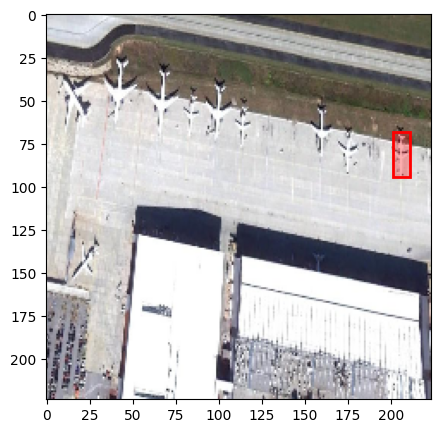

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def display_image_with_bbox(img, target):
    img = img.permute(1, 2, 0)
    fig, a = plt.subplots(1, 1)
    fig.set_size_inches(5, 5)
    a.imshow(img)

    box = target["boxes"][0]
    x, y, width, height = box[0], box[1], box[2] - box[0], box[3] - box[1]

    rect = patches.Rectangle(
        (x, y), width, height, linewidth=2, edgecolor='r', facecolor=(1, 0, 0, 0.3)
    )

    a.add_patch(rect)
    plt.show()


img, target = dataset[2]
display_image_with_bbox(img, target)

In [ ]:
dataset = ImagesDataset(positive, 480, 480,ID,CLASS,BOX,transforms= generate_transformations(train=True))
dataset_test = ImagesDataset(positive, 480, 480,ID,CLASS,BOX,transforms= generate_transformations(train=False))

In [ ]:
torch.manual_seed(1)
total_positive_images = len(positive_dataset)
indices = torch.randperm(total_positive_images).tolist()
num_training_images = 500
num_evaluation_images = total_positive_images - num_training_images

training_indices = indices[:num_training_images]
evaluation_indices = indices[num_training_images:]

training_dataset = torch.utils.data.Subset(dataset, training_indices)
evaluation_dataset = torch.utils.data.Subset(dataset_test, evaluation_indices)

training_data_loader = torch.utils.data.DataLoader(
    training_dataset, batch_size=10, shuffle=True, num_workers=4,
    collate_fn=utils.collate_fn)

test_data_loader = torch.utils.data.DataLoader(
    evaluation_dataset, batch_size=10, shuffle=False, num_workers=4,
    collate_fn=utils.collate_fn)





In [ ]:
import plotly.graph_objs as go


object_categories = {
    1: 'airplane',
    2: 'ship',
    3: 'storage tank',
    4: 'baseball diamond',
    5: 'tennis court',
    6: 'basketball court',
    7: 'ground track field',
    8: 'harbor',
    9: 'bridge',
    10: 'vehicle'
}


train_counts = {category: 0 for category in object_categories}
eval_counts = {category: 0 for category in object_categories}


for idx in training_indices:
    classes = CLASS[idx]
    for category in classes:
        train_counts[category] += 1


for idx in evaluation_indices:
    classes = CLASS[idx]
    for category in classes:
        eval_counts[category] += 1


categories = list(object_categories.values())


training_data = go.Bar(
    x=[object_categories.get(category) for category in object_categories.keys()],
    y=[train_counts.get(category, 0) for category in object_categories.keys()],
    name='Training',
    marker=dict(color='red'),
)


test_data = go.Bar(
    x=[object_categories.get(category) for category in object_categories.keys()],
    y=[eval_counts.get(category, 0) for category in object_categories.keys()],
    name='Evaluation',
    marker=dict(color='blue'),
)

layout = go.Layout(
    title='Statistics of total number of objects of each category',
    xaxis=dict(title='Object Category', tickangle=45),
    yaxis=dict(title='Number of Objects'),
    barmode='group',
)

fig = go.Figure(data=[training_data, test_data], layout=layout)
fig.show()


In [ ]:

def create_detection_model(num_classes):


    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

    input_features = model.roi_heads.box_predictor.cls_score.in_features

    model.roi_heads.box_predictor = FastRCNNPredictor(input_features, num_classes)

    return model

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')


num_classes = 11

### **Optimization technique:SGD**

In [ ]:

model = create_detection_model(num_classes)


model.to(device)


params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.003,
                            momentum=0.9, weight_decay=0.0005)



lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=3,
                                               gamma=0.1)


Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:01<00:00, 137MB/s]


In [ ]:

num_epochs = 10

for epoch in range(num_epochs):

    train_one_epoch(model, optimizer, training_data_loader, device, epoch, print_freq=10)

    lr_scheduler.step()



Epoch: [0]  [ 0/50]  eta: 0:07:42  lr: 0.000043  loss: 2.6517 (2.6517)  loss_classifier: 2.0621 (2.0621)  loss_box_reg: 0.3412 (0.3412)  loss_objectness: 0.2245 (0.2245)  loss_rpn_box_reg: 0.0239 (0.0239)  time: 9.2538  data: 3.8992  max mem: 8221
Epoch: [0]  [10/50]  eta: 0:01:33  lr: 0.000451  loss: 2.3910 (2.0748)  loss_classifier: 1.7479 (1.5226)  loss_box_reg: 0.2028 (0.2331)  loss_objectness: 0.2455 (0.2980)  loss_rpn_box_reg: 0.0214 (0.0211)  time: 2.3408  data: 0.3871  max mem: 8382
Epoch: [0]  [20/50]  eta: 0:01:00  lr: 0.000858  loss: 1.3606 (1.6297)  loss_classifier: 0.8058 (1.1011)  loss_box_reg: 0.2742 (0.3008)  loss_objectness: 0.1493 (0.2074)  loss_rpn_box_reg: 0.0183 (0.0204)  time: 1.6578  data: 0.0333  max mem: 8382
Epoch: [0]  [30/50]  eta: 0:00:38  lr: 0.001266  loss: 0.9415 (1.4118)  loss_classifier: 0.5030 (0.9009)  loss_box_reg: 0.3563 (0.3173)  loss_objectness: 0.1090 (0.1750)  loss_rpn_box_reg: 0.0157 (0.0186)  time: 1.6771  data: 0.0327  max mem: 8382
Epoch: [

In [ ]:
evaluate(model, test_data_loader, device=device)

creating index...
index created!
Test:  [ 0/15]  eta: 0:00:33  model_time: 0.8672 (0.8672)  evaluator_time: 0.3452 (0.3452)  time: 2.2472  data: 0.9618  max mem: 8382
Test:  [14/15]  eta: 0:00:00  model_time: 0.7512 (0.7612)  evaluator_time: 0.0477 (0.0732)  time: 0.9425  data: 0.0940  max mem: 8382
Test: Total time: 0:00:14 (0.9488 s / it)
Averaged stats: model_time: 0.7512 (0.7612)  evaluator_time: 0.0477 (0.0732)
Accumulating evaluation results...
DONE (t=0.14s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.396
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.751
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.369
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.294
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.384
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.465
 Average Recall     (AR) @[ IoU=

In [ ]:
def filter_overlapping_boxes(orig_prediction, iou_thresh=0.3):
    boxes = orig_prediction['boxes']
    scores = orig_prediction['scores']
    labels = orig_prediction['labels']


    keep = torchvision.ops.nms(boxes, scores, iou_thresh)


    final_prediction = {
        'boxes': boxes[keep],
        'scores': scores[keep],
        'labels': labels[keep]
    }

    return final_prediction


In [ ]:
def torch_to_pil(img):
    return torchtrans.ToPILImage()(img).convert('RGB')

In [ ]:
import matplotlib.patches as patches
import matplotlib.pyplot as plt


class_colors = {
    1: 'red',
    2: 'blue',
    3: 'green',
    4: 'orange',
    5: 'purple',
    6: 'brown',
    7: 'yellow',
    8: 'pink',
    9: 'gray',
    10: 'cyan'
}


class_facecolors = {
    1: (1, 0, 0, 0.3),  # airplane - red
    2: (0, 0, 1, 0.3),  # ship - blue
    3: (0, 1, 0, 0.3),  # storage tank - green
    4: (1, 0.5, 0, 0.3),  # baseball diamond - orange
    5: (0.5, 0, 0.5, 0.3),  # tennis court - purple
    6: (0.6, 0.3, 0.1, 0.3),  # basketball court - brown
    7: (1, 1, 0, 0.3),  # ground track field - yellow
    8: (1, 0.75, 0.8, 0.3),  # harbor - pink
    9: (0.5, 0.5, 0.5, 0.3),  # bridge - gray
    10: (0, 1, 1, 0.3),  # vehicle - cyan
}


class_labels = {
    1: 'Airplane',
    2: 'Ship',
    3: 'Storage Tank',
    4: 'Baseball Diamond',
    5: 'Tennis Court',
    6: 'Basketball Court',
    7: 'Ground Track Field',
    8: 'Harbor',
    9: 'Bridge',
    10: 'Vehicle'
}

def display_image_with_bbox(img, target):
    fig, ax = plt.subplots(1, 1)
    fig.set_size_inches(5, 5)
    ax.imshow(img)

    boxes = target['boxes']
    labels = target['labels']

    for i in range(len(boxes)):
        box = boxes[i]
        label = labels[i].item()


        edgecolor = class_colors.get(label, 'red')
        facecolor = class_facecolors.get(label, (1, 0, 0, 0.3))
        label_name = class_labels.get(label, 'Unknown Class')

        x, y, w, h = box.tolist()
        width, height = w - x, h - y


        rect = patches.Rectangle(
            (x, y), width, height, linewidth=2, edgecolor=edgecolor, facecolor=facecolor
        )

        ax.add_patch(rect)


        ax.text(x, y - 5, label_name, color='white', fontsize=8)

    plt.show()


Image 139:
Predicted number of boxes: 77
Predicted labels: [10, 10, 10, 10, 10, 10, 10, 10, 7, 7, 4, 10, 5, 10, 8, 6, 4, 3, 5, 10, 8, 4, 5, 6, 10, 6, 10, 8, 10, 5, 6, 2, 5, 4, 10, 8, 8, 6, 10, 5, 10, 5, 8, 6, 5, 10, 10, 5, 3, 10, 6, 8, 6, 5, 5, 5, 5, 6, 8, 6, 10, 8, 6, 8, 3, 5, 6, 8, 8, 5, 10, 6, 5, 6, 5, 5, 5]


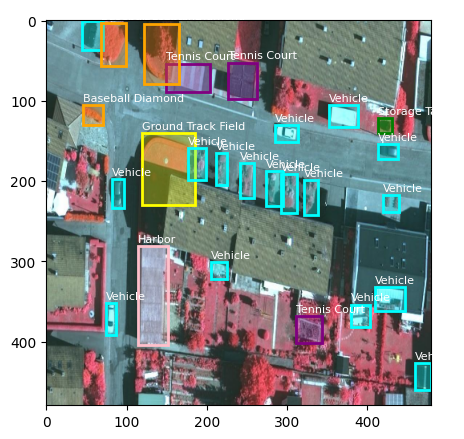

Image 121:
Predicted number of boxes: 43
Predicted labels: [10, 1, 10, 10, 10, 7, 10, 8, 1, 3, 10, 7, 10, 10, 10, 8, 6, 8, 10, 3, 7, 5, 2, 8, 4, 10, 6, 10, 8, 5, 6, 8, 2, 7, 5, 10, 1, 5, 6, 8, 4, 6, 5]


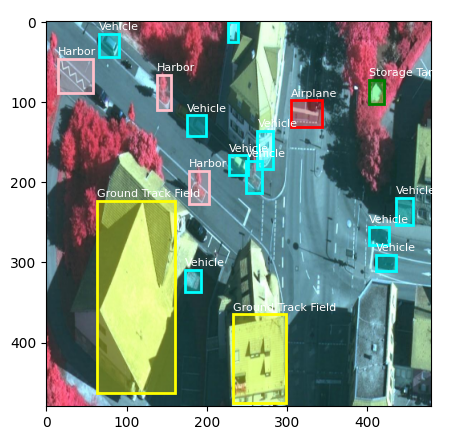

Image 41:
Predicted number of boxes: 47
Predicted labels: [4, 5, 5, 5, 4, 6, 5, 5, 5, 8, 6, 5, 5, 7, 6, 5, 6, 8, 6, 5, 8, 5, 8, 10, 6, 7, 8, 8, 8, 10, 5, 7, 10, 2, 6, 9, 10, 5, 6, 5, 5, 6, 5, 5, 8, 5, 6]


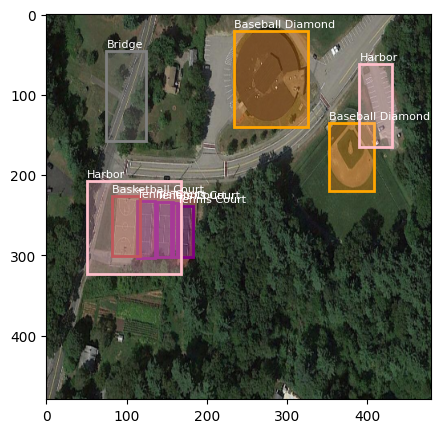

Image 102:
Predicted number of boxes: 22
Predicted labels: [6, 6, 8, 8, 8, 8, 7, 5, 4, 8, 8, 5, 6, 7, 10, 4, 10, 2, 5, 5, 10, 6]


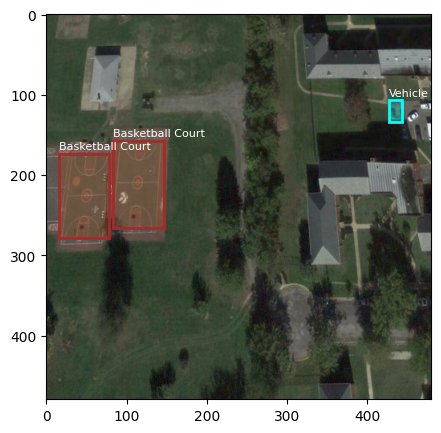

Image 71:
Predicted number of boxes: 44
Predicted labels: [3, 3, 2, 3, 3, 3, 3, 3, 2, 3, 2, 4, 2, 5, 10, 4, 8, 4, 9, 9, 9, 4, 4, 6, 9, 1, 8, 9, 9, 1, 8, 4, 9, 8, 9, 8, 4, 5, 2, 8, 9, 9, 4, 8]


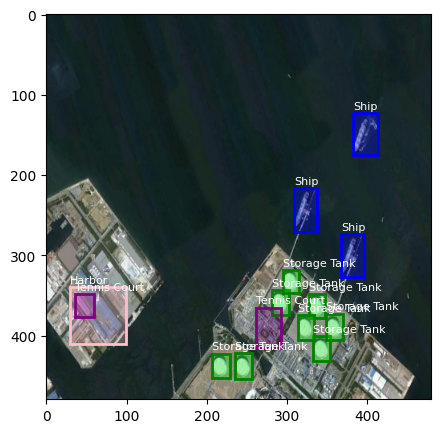

In [ ]:
random_indices = random.sample(range(len(evaluation_dataset)), 5)


model.eval()
with torch.no_grad():
    for idx in random_indices:

        test_img, test_target = evaluation_dataset[idx]

        test_img_pil = torch_to_pil(test_img)


        prediction = model([test_img.to(device)])[0]


        print(f'Image {idx + 1}:')
        print('Predicted number of boxes:', len(prediction['boxes']))
        print('Predicted labels:', prediction['labels'].tolist())


        filtered_prediction = filter_overlapping_boxes(prediction, iou_thresh=0.2)


        display_image_with_bbox(test_img_pil, filtered_prediction)

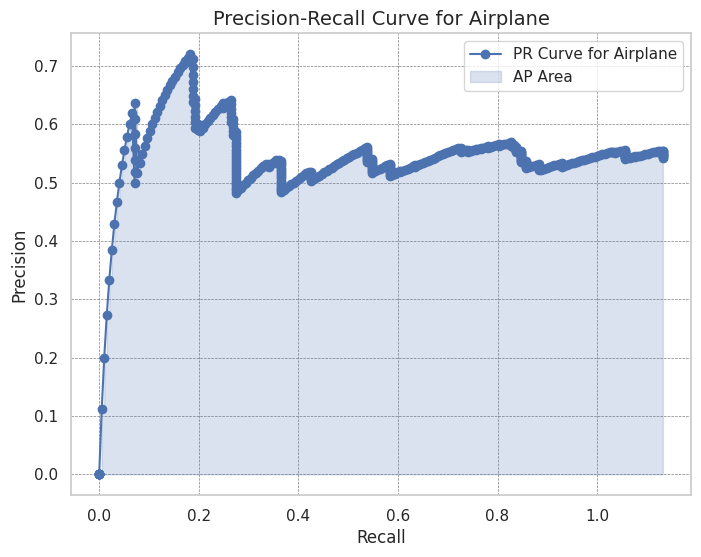

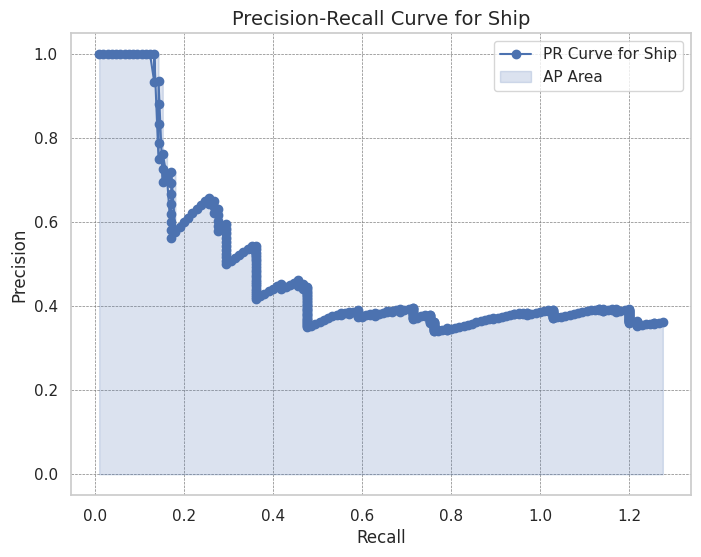

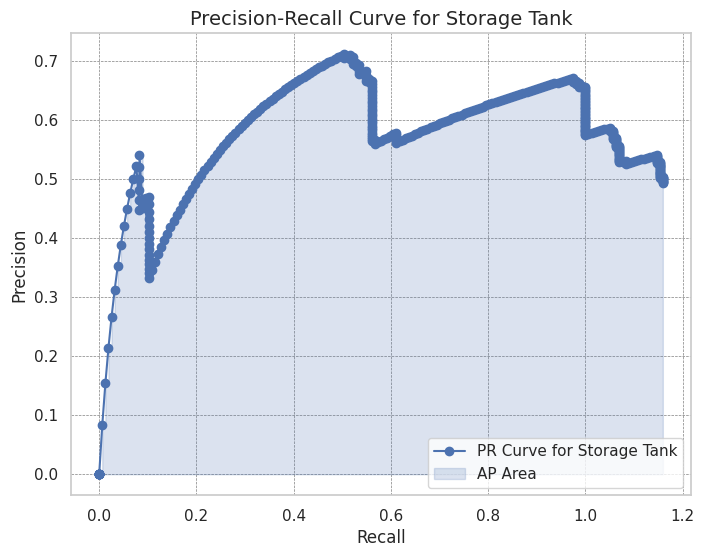

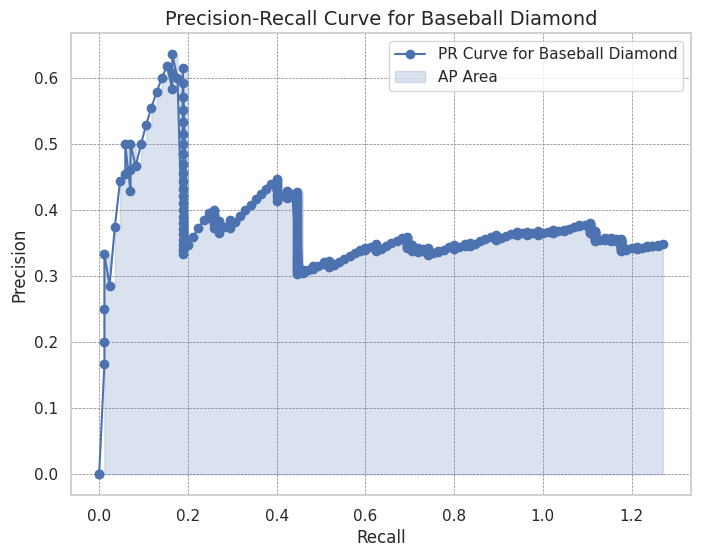

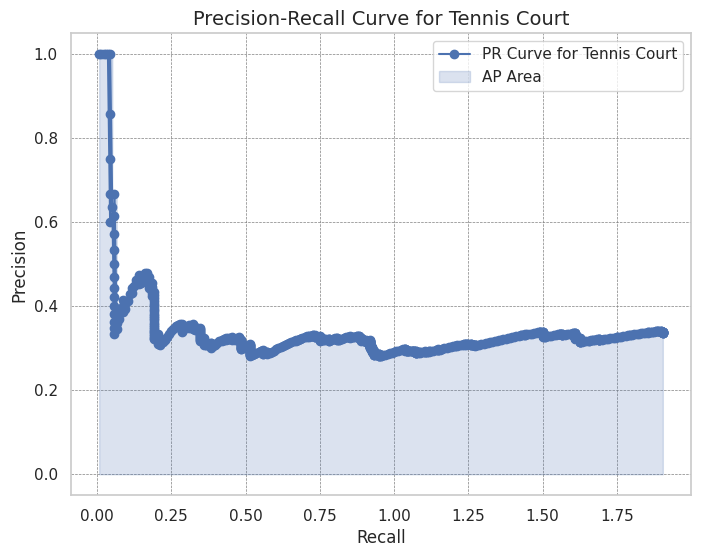

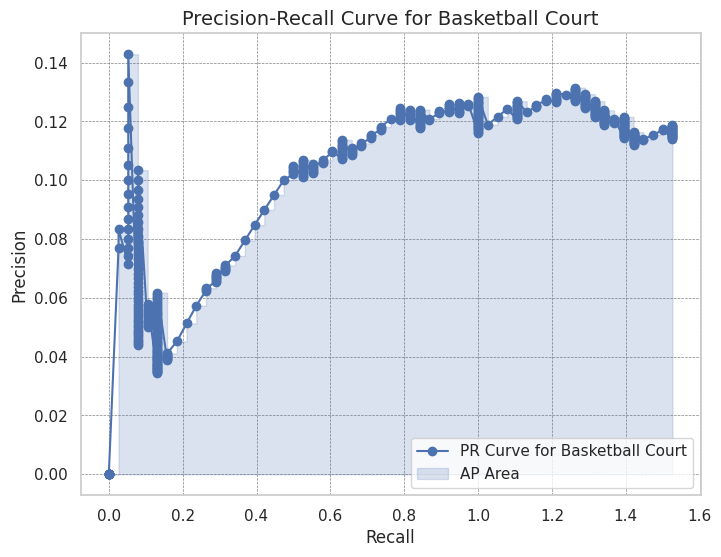

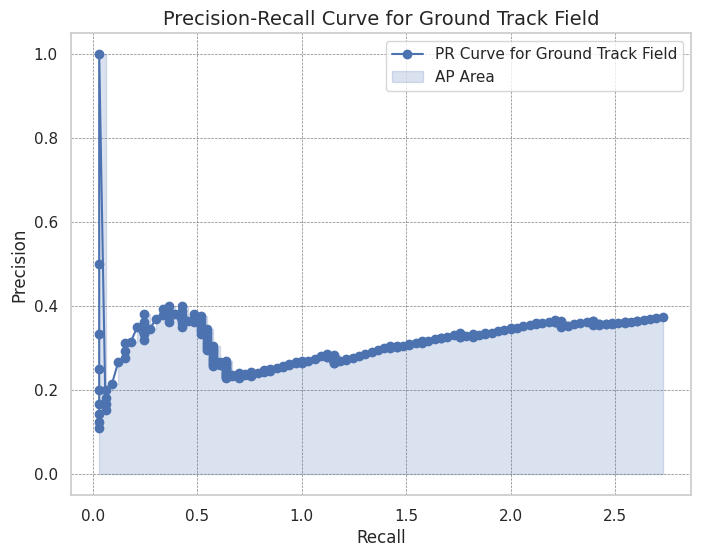

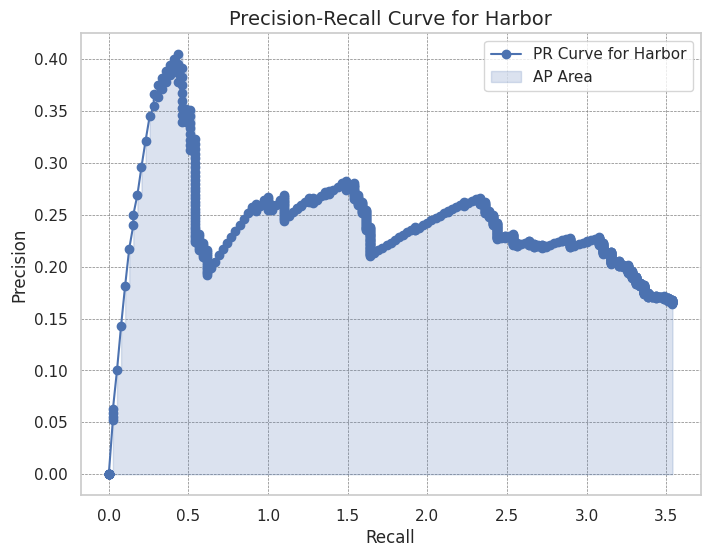

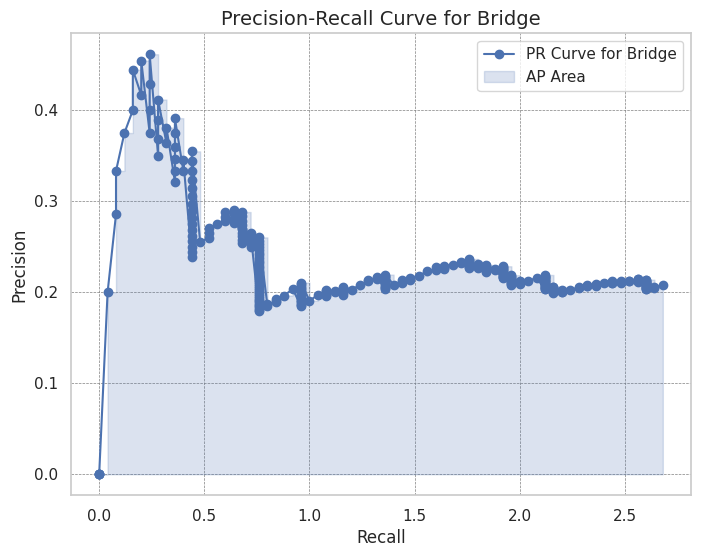

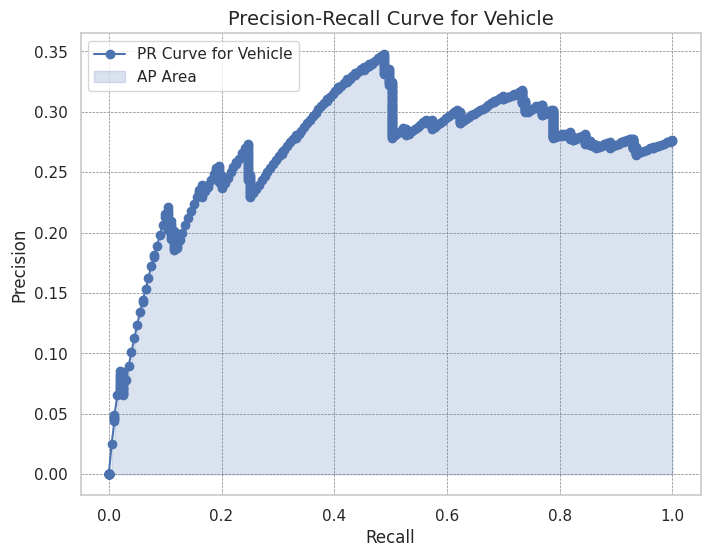

In [ ]:
import seaborn as sns
from sklearn.metrics import precision_recall_curve, average_precision_score
from torchvision.ops import box_iou

def compute_precision_recall(gt_boxes, pred_boxes, pred_scores, iou_thresh=0.5):
    tp = 0
    fp = 0
    fn = len(gt_boxes)

    precisions = []
    recalls = []


    for pred_box, pred_score in zip(pred_boxes, pred_scores):
        matched = False
        iou_values = [
            box_iou(torch.tensor([gt_box]), torch.tensor([pred_box]))[0][0].item() for gt_box in gt_boxes
        ]
        max_iou = max(iou_values)

        if max_iou >= iou_thresh:
            tp += 1
            fn -= 1
            matched = True
        else:
            fp += 1


        precision = tp / (tp + fp)
        recall = tp / (tp + fn)

        precisions.append(precision)
        recalls.append(recall)

    return precisions, recalls


def plot_precision_recall_curve(precisions, recalls, class_name):
    recalls, precisions = zip(*sorted(zip(recalls, precisions)))

    plt.figure(figsize=(8, 6))
    sns.set(style='whitegrid')

    plt.plot(recalls, precisions, '-o', color='b', label=f'PR Curve for {class_name}')
    plt.fill_between(recalls, precisions, alpha=0.2, color='b', step='post', label='AP Area')

    plt.xlabel('Recall', fontsize=12)
    plt.ylabel('Precision', fontsize=12)
    plt.title(f'Precision-Recall Curve for {class_name}', fontsize=14)
    plt.legend()
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
    plt.show()


def plot_pr_curves_by_class(targets, predictions, object_categories):
    for class_id, class_name in object_categories.items():

        gt_boxes_cls = [
            box for gt in targets for box, label in zip(gt['boxes'].tolist(), gt['labels'].tolist()) if label == class_id
        ]
        pred_boxes_cls = [
            box for pred in predictions for box, label in zip(pred['boxes'].tolist(), pred['labels'].tolist()) if label == class_id
        ]
        pred_scores_cls = [
            score for pred in predictions for score, label in zip(pred['scores'].tolist(), pred['labels'].tolist()) if label == class_id
        ]


        precisions, recalls = compute_precision_recall(gt_boxes_cls, pred_boxes_cls, pred_scores_cls)


        plot_precision_recall_curve(precisions, recalls, class_name)


targets = [target for _, target in evaluation_dataset]
predictions = []

with torch.no_grad():
    for img, _ in evaluation_dataset:
        prediction = model([img.to(device)])[0]
        predictions.append(prediction)

object_categories = {
    1: 'Airplane',
    2: 'Ship',
    3: 'Storage Tank',
    4: 'Baseball Diamond',
    5: 'Tennis Court',
    6: 'Basketball Court',
    7: 'Ground Track Field',
    8: 'Harbor',
    9: 'Bridge',
    10: 'Vehicle'
}


plot_pr_curves_by_class(targets, predictions, object_categories)


### **Optimization technique:Adam**

In [ ]:


model = create_detection_model(num_classes)
model.to(device)

params = [p for p in model.parameters() if p.requires_grad]


optimizer = torch.optim.Adam(params, lr=0.0002, betas=(0.9, 0.999), weight_decay=0.0001)


lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)


num_epochs = 10

for epoch in range(num_epochs):

    train_one_epoch(model, optimizer, training_data_loader, device, epoch, print_freq=10)

    lr_scheduler.step()




Epoch: [0]  [ 0/50]  eta: 0:02:47  lr: 0.000004  loss: 3.1009 (3.1009)  loss_classifier: 2.6448 (2.6448)  loss_box_reg: 0.1865 (0.1865)  loss_objectness: 0.2538 (0.2538)  loss_rpn_box_reg: 0.0157 (0.0157)  time: 3.3499  data: 1.2661  max mem: 8895
Epoch: [0]  [10/50]  eta: 0:01:20  lr: 0.000045  loss: 2.6140 (2.3763)  loss_classifier: 2.0376 (1.8730)  loss_box_reg: 0.2707 (0.2678)  loss_objectness: 0.2055 (0.2162)  loss_rpn_box_reg: 0.0168 (0.0193)  time: 2.0017  data: 0.1481  max mem: 9212
Epoch: [0]  [20/50]  eta: 0:00:58  lr: 0.000086  loss: 1.1933 (1.6919)  loss_classifier: 0.7780 (1.2307)  loss_box_reg: 0.2912 (0.2979)  loss_objectness: 0.0861 (0.1460)  loss_rpn_box_reg: 0.0152 (0.0173)  time: 1.8678  data: 0.0368  max mem: 9212
Epoch: [0]  [30/50]  eta: 0:00:38  lr: 0.000127  loss: 0.9309 (1.4334)  loss_classifier: 0.4876 (0.9822)  loss_box_reg: 0.3522 (0.3214)  loss_objectness: 0.0477 (0.1137)  loss_rpn_box_reg: 0.0130 (0.0161)  time: 1.8579  data: 0.0390  max mem: 9212
Epoch: [

In [ ]:
evaluate(model, test_data_loader, device=device)

creating index...
index created!
Test:  [ 0/15]  eta: 0:00:42  model_time: 1.0176 (1.0176)  evaluator_time: 0.0650 (0.0650)  time: 2.8019  data: 1.6583  max mem: 9212
Test:  [14/15]  eta: 0:00:01  model_time: 0.8226 (0.8500)  evaluator_time: 0.0650 (0.0864)  time: 1.1194  data: 0.1630  max mem: 9212
Test: Total time: 0:00:16 (1.1271 s / it)
Averaged stats: model_time: 0.8226 (0.8500)  evaluator_time: 0.0650 (0.0864)
Accumulating evaluation results...
DONE (t=0.10s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.533
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.892
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.554
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.412
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.528
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.704
 Average Recall     (AR) @[ IoU=

Image 77:
Predicted number of boxes: 9
Predicted labels: [4, 6, 4, 6, 6, 8, 6, 6, 4]


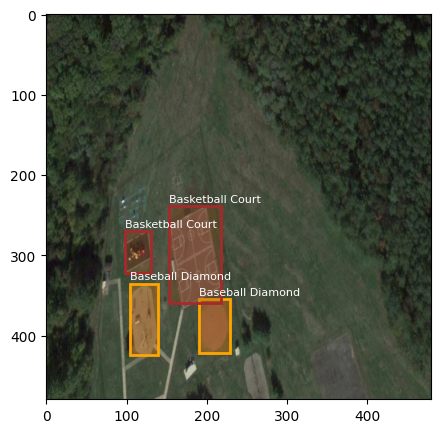

Image 150:
Predicted number of boxes: 3
Predicted labels: [9, 9, 9]


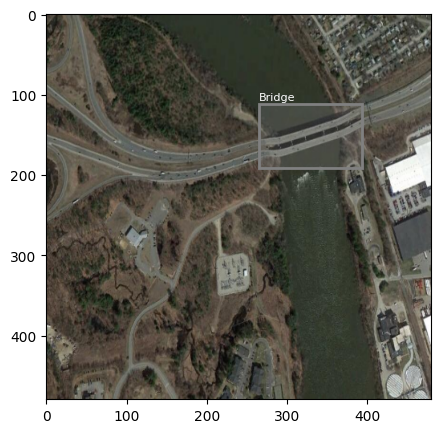

Image 64:
Predicted number of boxes: 9
Predicted labels: [1, 1, 1, 1, 1, 1, 3, 3, 10]


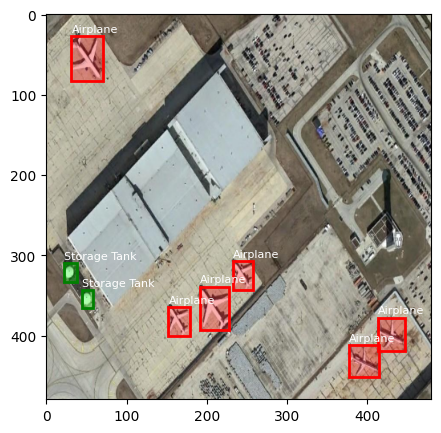

Image 4:
Predicted number of boxes: 29
Predicted labels: [8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 1, 8, 8, 8, 8, 6, 8, 6, 8, 8, 8, 6, 6, 6, 6]


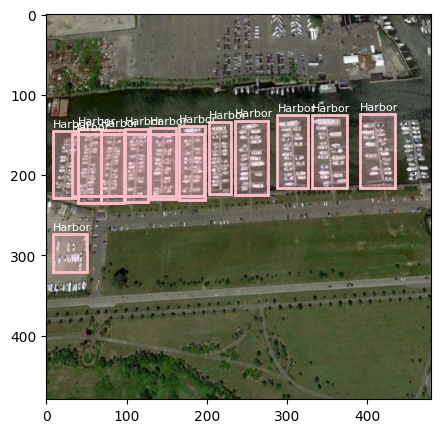

Image 54:
Predicted number of boxes: 15
Predicted labels: [9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 8, 9]


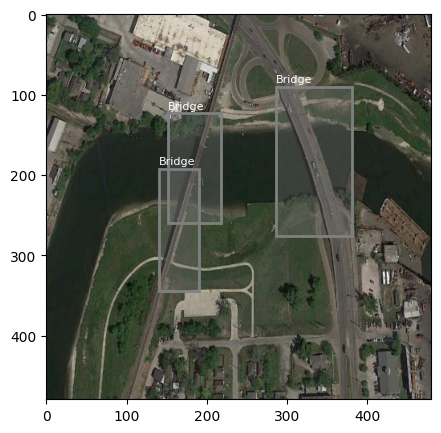

In [ ]:
random_indices = random.sample(range(len(evaluation_dataset)), 5)


model.eval()
with torch.no_grad():
    for idx in random_indices:

        test_img, test_target = evaluation_dataset[idx]

        test_img_pil = torch_to_pil(test_img)


        prediction = model([test_img.to(device)])[0]


        print(f'Image {idx + 1}:')
        print('Predicted number of boxes:', len(prediction['boxes']))
        print('Predicted labels:', prediction['labels'].tolist())


        filtered_prediction = filter_overlapping_boxes(prediction, iou_thresh=0.2)


        display_image_with_bbox(test_img_pil, filtered_prediction)

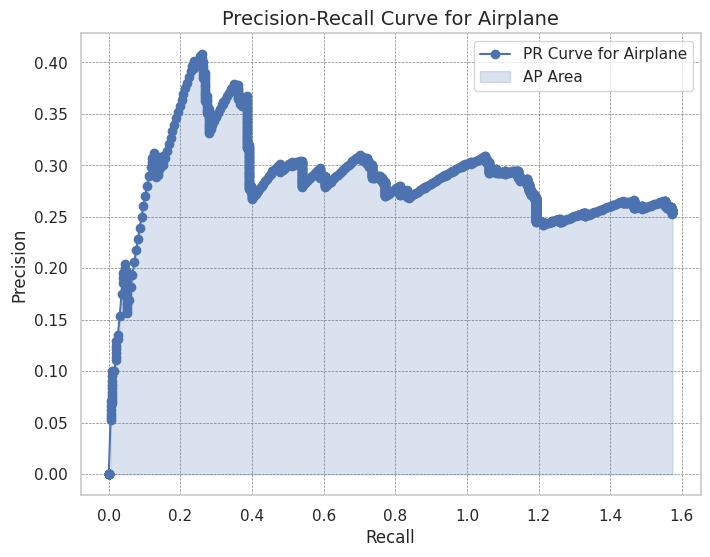

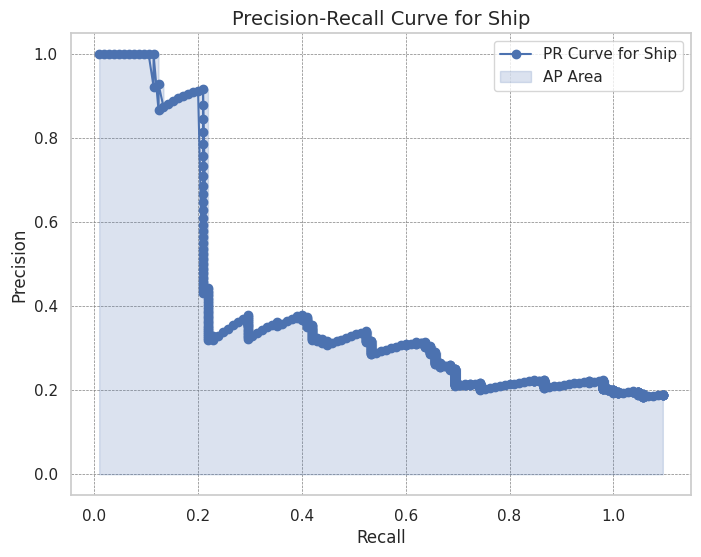

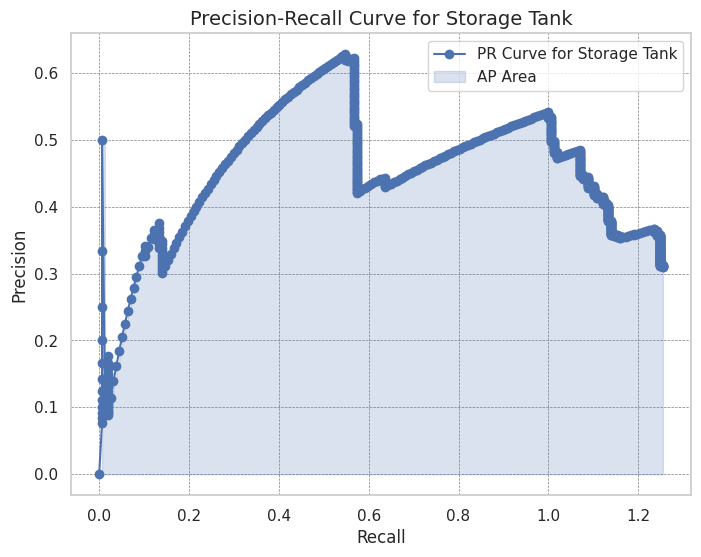

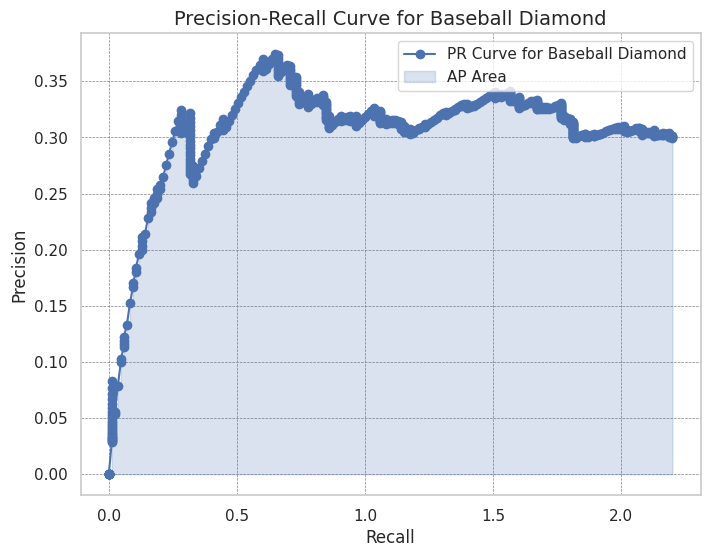

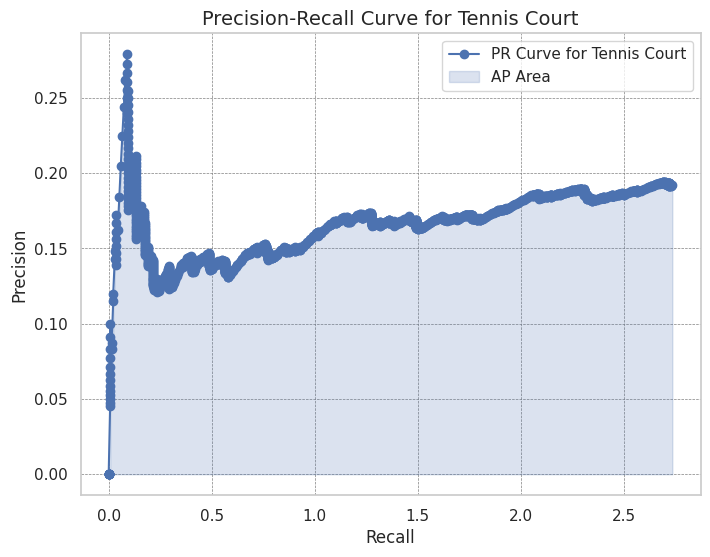

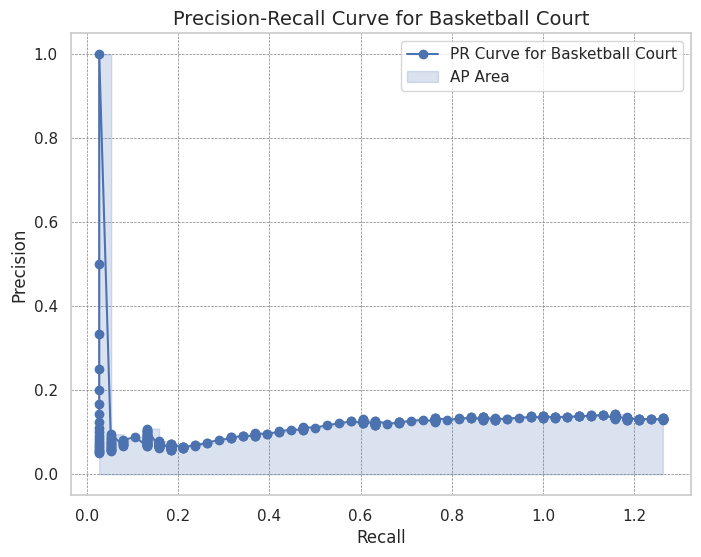

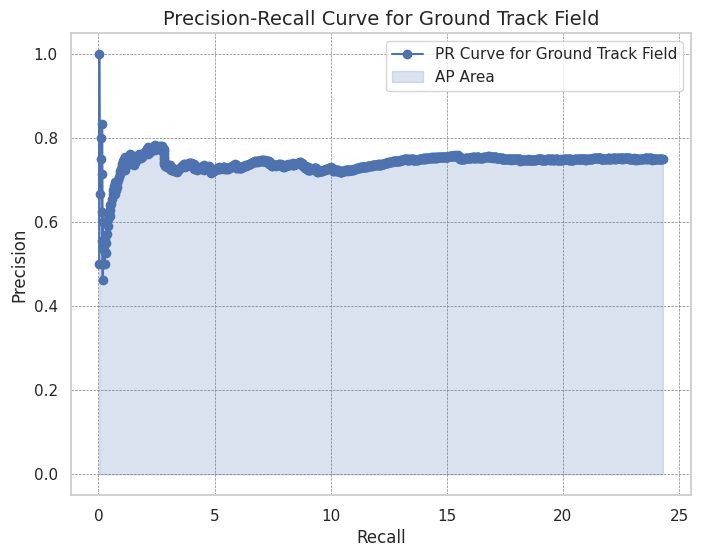

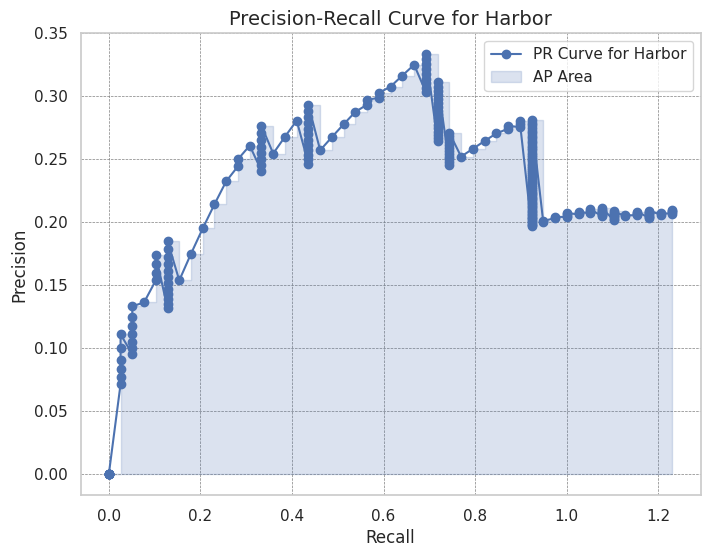

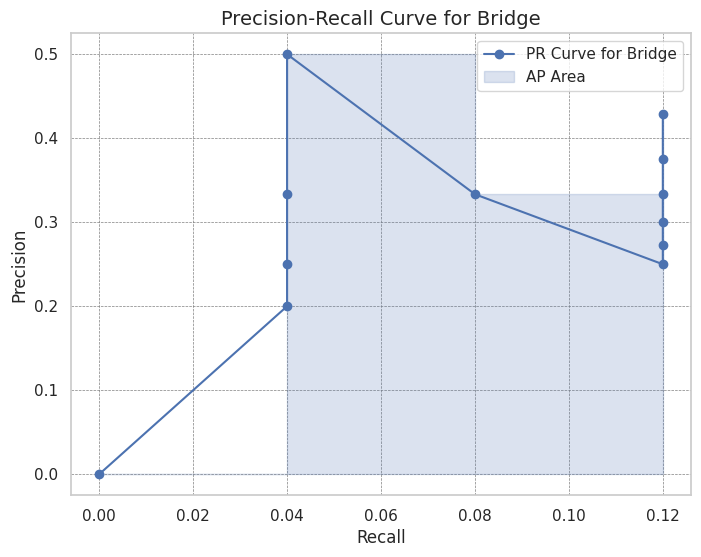

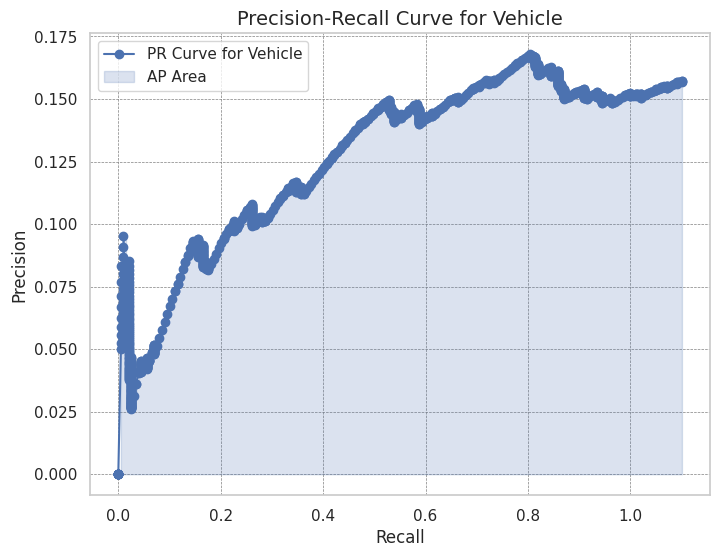

In [ ]:
targets = [target for _, target in evaluation_dataset]
predictions = []

with torch.no_grad():
    for img, _ in evaluation_dataset:
        prediction = model([img.to(device)])[0]
        predictions.append(prediction)

object_categories = {
    1: 'Airplane',
    2: 'Ship',
    3: 'Storage Tank',
    4: 'Baseball Diamond',
    5: 'Tennis Court',
    6: 'Basketball Court',
    7: 'Ground Track Field',
    8: 'Harbor',
    9: 'Bridge',
    10: 'Vehicle'
}


plot_pr_curves_by_class(targets, predictions, object_categories)


### **Optimization technique:RMSprop**

In [ ]:

model = create_detection_model(num_classes)
model.to(device)


params = [p for p in model.parameters() if p.requires_grad]

optimizer = torch.optim.RMSprop(params, lr=0.0001, alpha=0.9, eps=1e-6, momentum=0.9, centered=False, weight_decay=0.0001)


lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

num_epochs = 10

for epoch in range(num_epochs):
    train_one_epoch(model, optimizer, training_data_loader, device, epoch, print_freq=10)
    lr_scheduler.step()





Epoch: [0]  [ 0/50]  eta: 0:02:47  lr: 0.000002  loss: 3.2159 (3.2159)  loss_classifier: 2.3497 (2.3497)  loss_box_reg: 0.3923 (0.3923)  loss_objectness: 0.4391 (0.4391)  loss_rpn_box_reg: 0.0349 (0.0349)  time: 3.3580  data: 1.5331  max mem: 9212
Epoch: [0]  [10/50]  eta: 0:01:15  lr: 0.000023  loss: 1.7072 (1.8796)  loss_classifier: 1.0920 (1.3411)  loss_box_reg: 0.2872 (0.3134)  loss_objectness: 0.1981 (0.2055)  loss_rpn_box_reg: 0.0187 (0.0197)  time: 1.8761  data: 0.1700  max mem: 9212
Epoch: [0]  [20/50]  eta: 0:00:54  lr: 0.000043  loss: 1.2036 (1.4521)  loss_classifier: 0.6734 (0.9681)  loss_box_reg: 0.2605 (0.2989)  loss_objectness: 0.0990 (0.1664)  loss_rpn_box_reg: 0.0178 (0.0187)  time: 1.7303  data: 0.0349  max mem: 9212
Epoch: [0]  [30/50]  eta: 0:00:35  lr: 0.000063  loss: 0.8247 (1.2821)  loss_classifier: 0.4286 (0.8054)  loss_box_reg: 0.2815 (0.3189)  loss_objectness: 0.0747 (0.1371)  loss_rpn_box_reg: 0.0200 (0.0206)  time: 1.7447  data: 0.0374  max mem: 9212
Epoch: [

In [ ]:
evaluate(model, test_data_loader, device=device)

creating index...
index created!
Test:  [ 0/15]  eta: 0:00:40  model_time: 0.8819 (0.8819)  evaluator_time: 0.0257 (0.0257)  time: 2.6753  data: 1.7171  max mem: 9212
Test:  [14/15]  eta: 0:00:00  model_time: 0.7936 (0.7972)  evaluator_time: 0.0257 (0.0416)  time: 0.9977  data: 0.1455  max mem: 9212
Test: Total time: 0:00:15 (1.0053 s / it)
Averaged stats: model_time: 0.7936 (0.7972)  evaluator_time: 0.0257 (0.0416)
Accumulating evaluation results...
DONE (t=0.10s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.480
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.837
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.495
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.383
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.497
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.546
 Average Recall     (AR) @[ IoU=

Image 122:
Predicted number of boxes: 28
Predicted labels: [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 8, 1, 8]


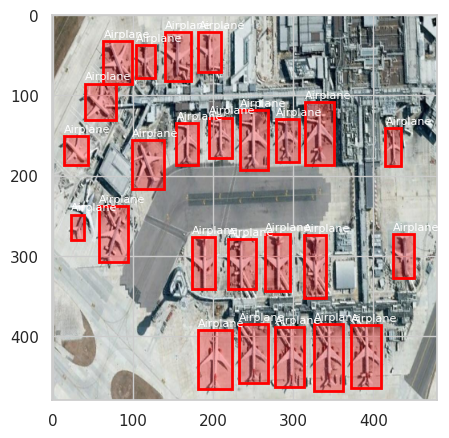

Image 93:
Predicted number of boxes: 9
Predicted labels: [1, 1, 1, 1, 1, 1, 1, 10, 9]


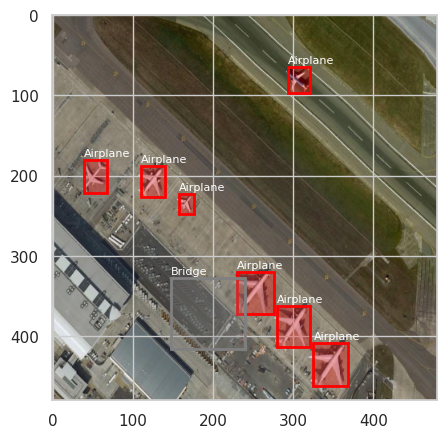

Image 67:
Predicted number of boxes: 15
Predicted labels: [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 8, 8, 1, 8, 8]


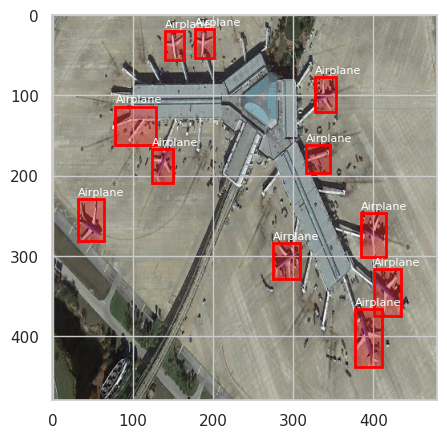

Image 137:
Predicted number of boxes: 17
Predicted labels: [4, 6, 6, 4, 7, 6, 7, 7, 7, 8, 6, 9, 6, 9, 9, 9, 9]


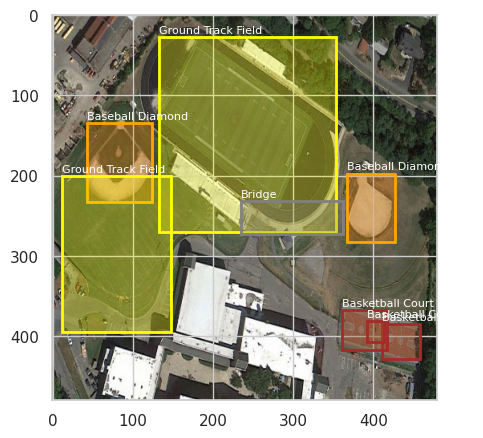

Image 103:
Predicted number of boxes: 25
Predicted labels: [4, 5, 5, 5, 5, 6, 6, 5, 9, 5, 5, 5, 5, 7, 7, 5, 5, 7, 9, 9, 6, 6, 6, 4, 6]


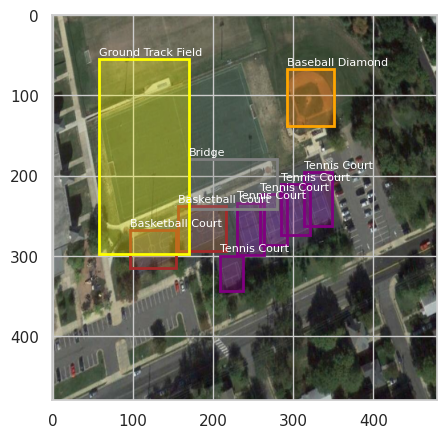

In [ ]:
random_indices = random.sample(range(len(evaluation_dataset)), 5)


model.eval()
with torch.no_grad():
    for idx in random_indices:

        test_img, test_target = evaluation_dataset[idx]

        test_img_pil = torch_to_pil(test_img)


        prediction = model([test_img.to(device)])[0]


        print(f'Image {idx + 1}:')
        print('Predicted number of boxes:', len(prediction['boxes']))
        print('Predicted labels:', prediction['labels'].tolist())


        filtered_prediction = filter_overlapping_boxes(prediction, iou_thresh=0.2)


        display_image_with_bbox(test_img_pil, filtered_prediction)

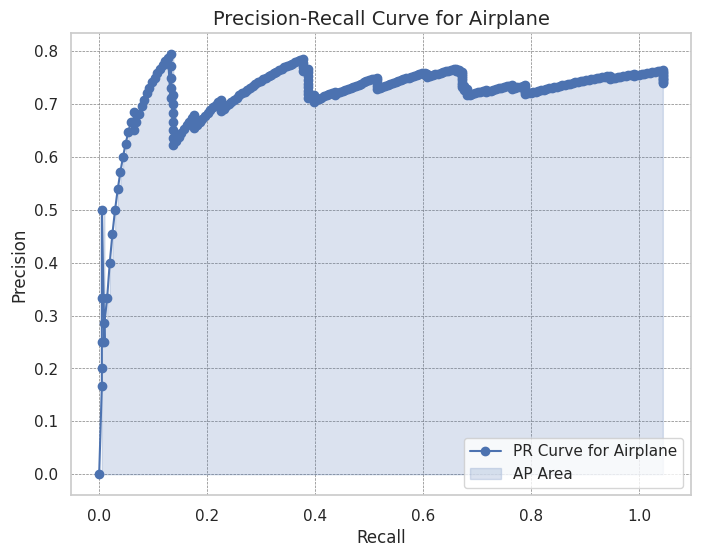

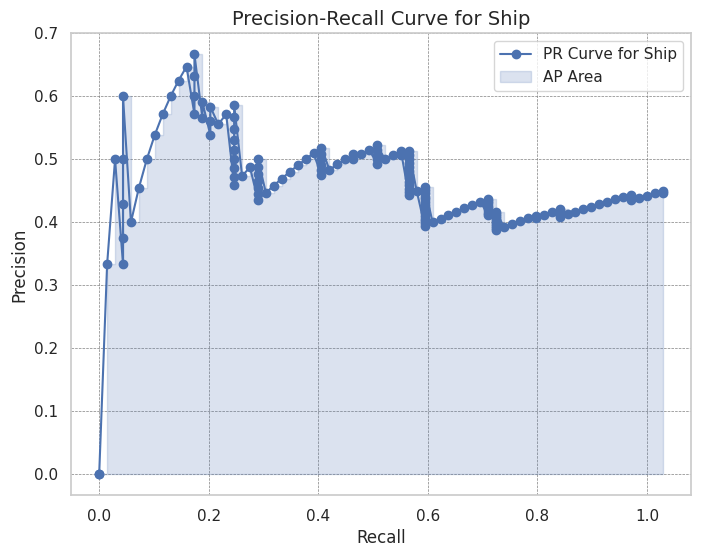

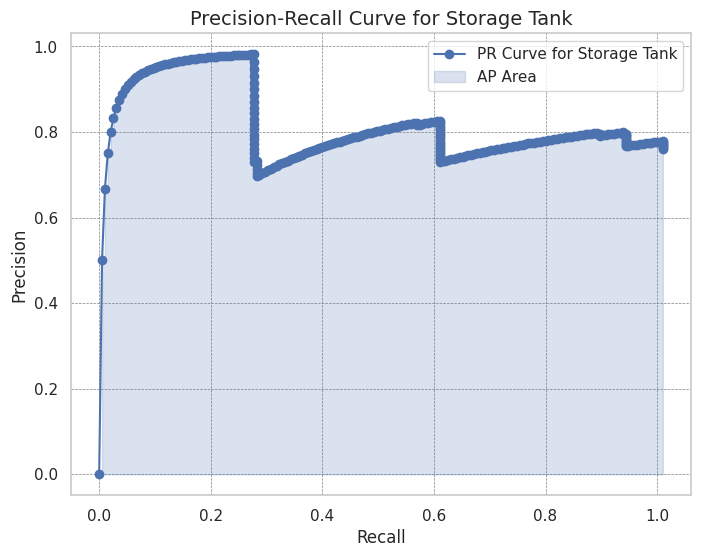

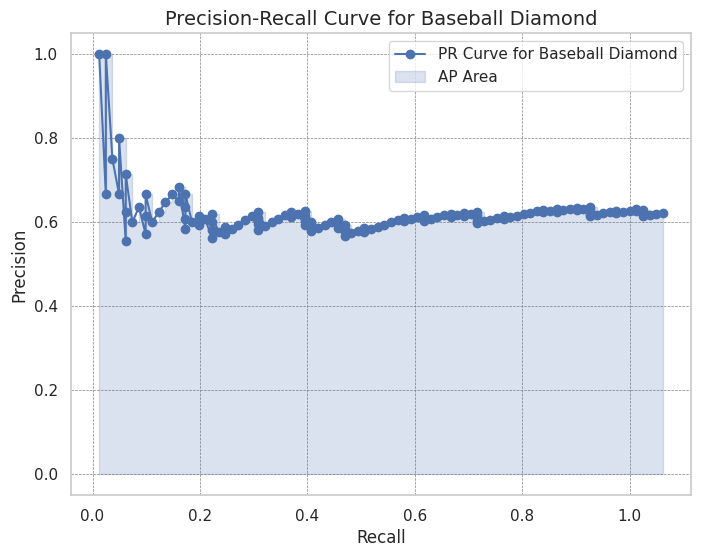

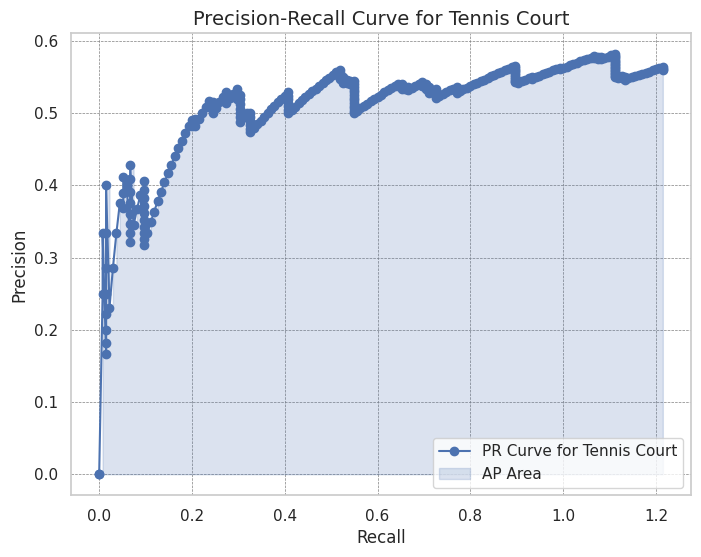

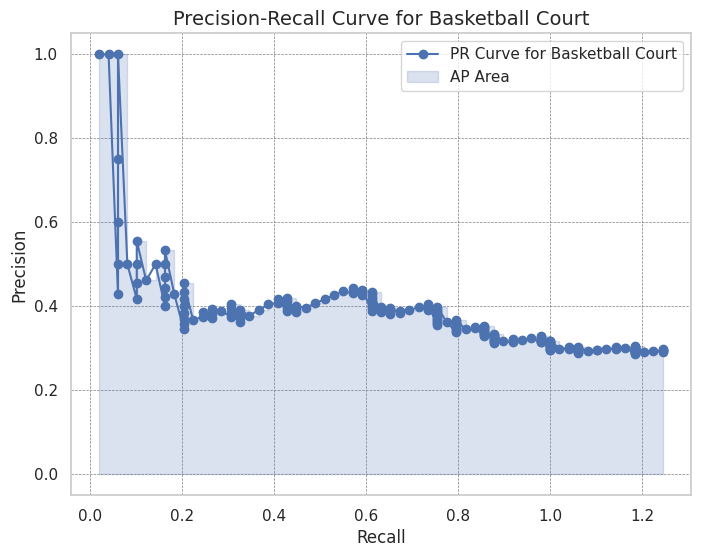

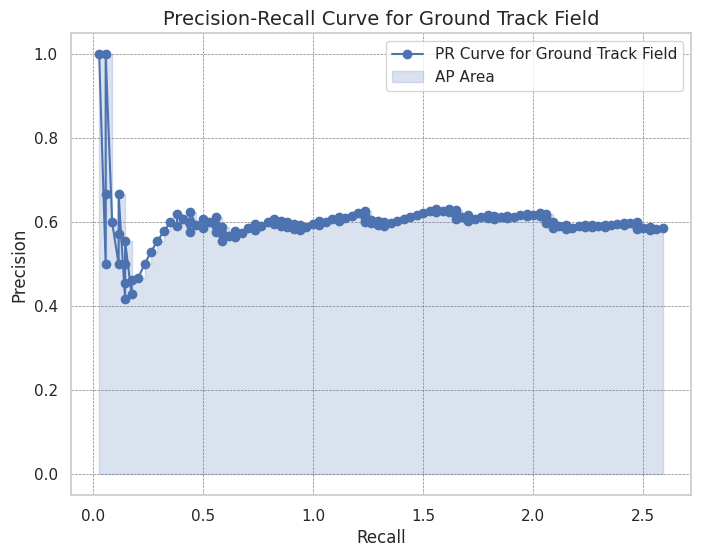

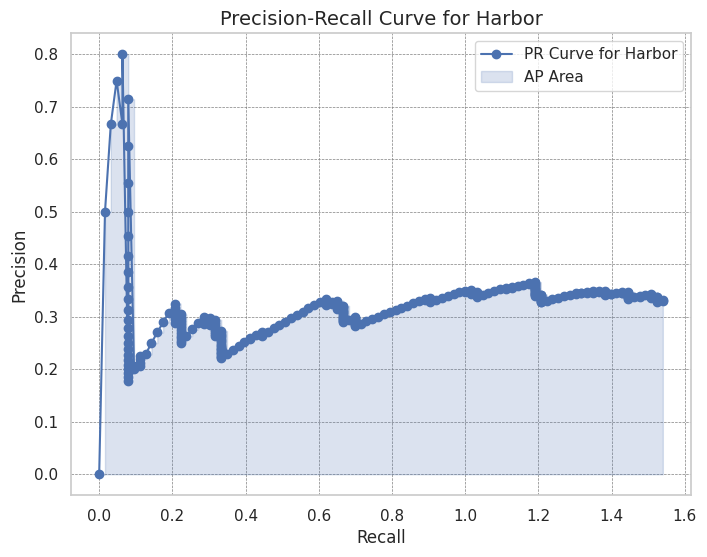

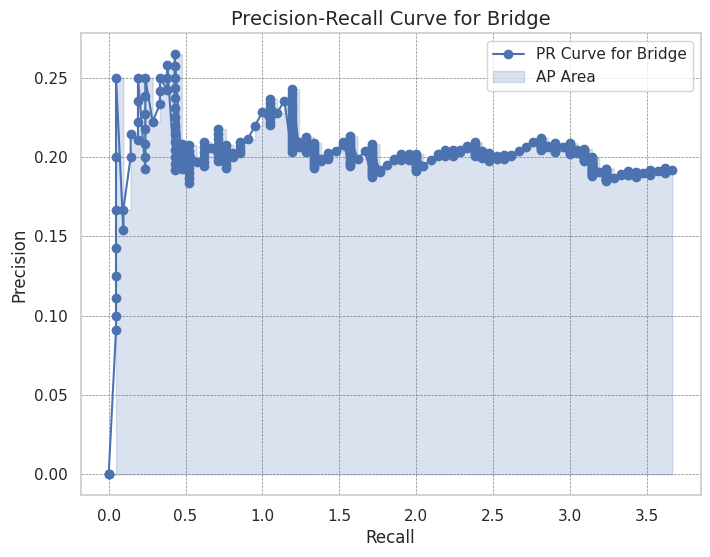

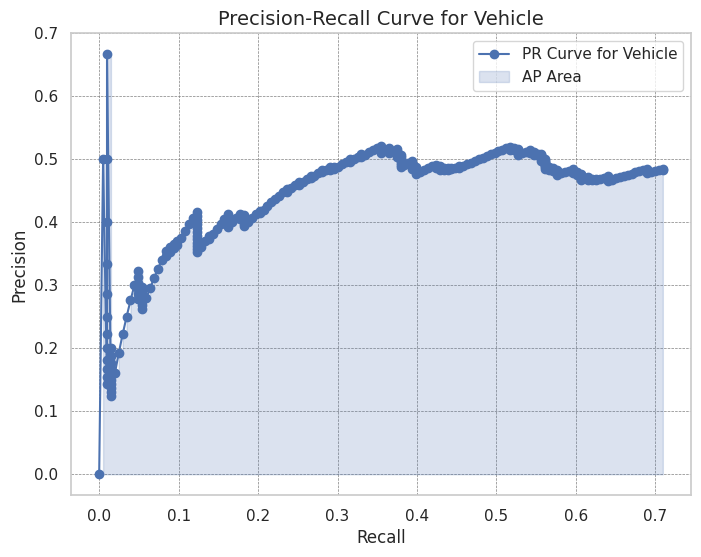

In [ ]:
targets = [target for _, target in evaluation_dataset]
predictions = []

with torch.no_grad():
    for img, _ in evaluation_dataset:
        prediction = model([img.to(device)])[0]
        predictions.append(prediction)

object_categories = {
    1: 'Airplane',
    2: 'Ship',
    3: 'Storage Tank',
    4: 'Baseball Diamond',
    5: 'Tennis Court',
    6: 'Basketball Court',
    7: 'Ground Track Field',
    8: 'Harbor',
    9: 'Bridge',
    10: 'Vehicle'
}


plot_pr_curves_by_class(targets, predictions, object_categories)


### **Optimization technique:Adadelta**

In [ ]:

model = create_detection_model(num_classes)
model.to(device)


params = [p for p in model.parameters() if p.requires_grad]


optimizer = torch.optim.Adadelta(params, lr=0.005, rho=0.9, eps=1e-6, weight_decay=0.0001)


lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

num_epochs = 10

for epoch in range(num_epochs):
    train_one_epoch(model, optimizer, training_data_loader, device, epoch, print_freq=10)
    lr_scheduler.step()





Epoch: [0]  [ 0/50]  eta: 0:02:36  lr: 0.000107  loss: 3.0833 (3.0833)  loss_classifier: 2.7669 (2.7669)  loss_box_reg: 0.1032 (0.1032)  loss_objectness: 0.2024 (0.2024)  loss_rpn_box_reg: 0.0107 (0.0107)  time: 3.1400  data: 1.1313  max mem: 9212
Epoch: [0]  [10/50]  eta: 0:01:14  lr: 0.001126  loss: 3.2746 (3.3403)  loss_classifier: 2.7075 (2.6844)  loss_box_reg: 0.3003 (0.2555)  loss_objectness: 0.3392 (0.3739)  loss_rpn_box_reg: 0.0207 (0.0265)  time: 1.8575  data: 0.1385  max mem: 9212
Epoch: [0]  [20/50]  eta: 0:00:53  lr: 0.002146  loss: 3.1001 (3.0788)  loss_classifier: 2.5497 (2.5204)  loss_box_reg: 0.2781 (0.2536)  loss_objectness: 0.2363 (0.2818)  loss_rpn_box_reg: 0.0196 (0.0230)  time: 1.7296  data: 0.0376  max mem: 9212
Epoch: [0]  [30/50]  eta: 0:00:35  lr: 0.003165  loss: 2.5180 (2.7740)  loss_classifier: 2.0360 (2.2425)  loss_box_reg: 0.2781 (0.2585)  loss_objectness: 0.1572 (0.2506)  loss_rpn_box_reg: 0.0192 (0.0224)  time: 1.7413  data: 0.0364  max mem: 9212
Epoch: [

In [ ]:
evaluate(model, test_data_loader, device=device)

creating index...
index created!
Test:  [ 0/15]  eta: 0:00:32  model_time: 0.8786 (0.8786)  evaluator_time: 0.0560 (0.0560)  time: 2.1358  data: 1.1855  max mem: 9212
Test:  [14/15]  eta: 0:00:00  model_time: 0.7935 (0.7971)  evaluator_time: 0.0681 (0.0657)  time: 0.9832  data: 0.1094  max mem: 9212
Test: Total time: 0:00:14 (0.9909 s / it)
Averaged stats: model_time: 0.7935 (0.7971)  evaluator_time: 0.0681 (0.0657)
Accumulating evaluation results...
DONE (t=0.23s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.097
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.253
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.039
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.037
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.114
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.158
 Average Recall     (AR) @[ IoU=

Image 85:
Predicted number of boxes: 100
Predicted labels: [7, 4, 4, 4, 4, 5, 5, 4, 4, 4, 4, 1, 5, 5, 5, 4, 5, 4, 4, 4, 4, 7, 6, 5, 10, 3, 10, 4, 4, 4, 3, 5, 10, 4, 3, 4, 10, 2, 5, 6, 4, 6, 4, 5, 6, 4, 4, 3, 4, 4, 7, 4, 5, 10, 7, 5, 10, 3, 5, 10, 5, 4, 5, 3, 10, 7, 7, 2, 10, 4, 6, 1, 10, 4, 2, 5, 1, 10, 3, 3, 10, 5, 3, 4, 6, 6, 3, 10, 6, 7, 2, 5, 6, 10, 10, 8, 4, 1, 10, 6]


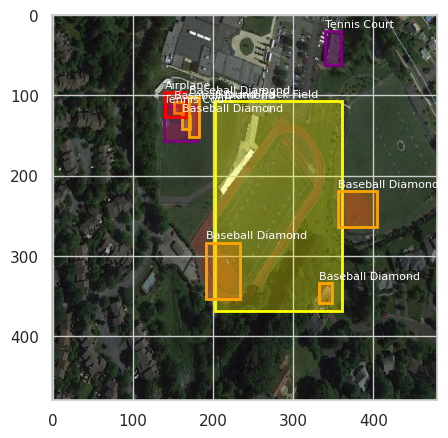

Image 108:
Predicted number of boxes: 99
Predicted labels: [4, 7, 4, 4, 4, 4, 1, 4, 10, 4, 2, 10, 5, 10, 4, 5, 7, 3, 4, 5, 10, 7, 10, 7, 5, 4, 3, 10, 7, 7, 10, 8, 1, 3, 2, 6, 4, 2, 10, 10, 7, 6, 1, 7, 10, 5, 6, 2, 2, 4, 6, 4, 8, 6, 4, 2, 5, 6, 7, 8, 3, 10, 5, 2, 3, 1, 7, 8, 4, 8, 10, 4, 8, 6, 9, 3, 2, 6, 7, 8, 9, 1, 2, 7, 6, 7, 3, 5, 2, 6, 5, 1, 3, 5, 10, 6, 5, 6, 10]


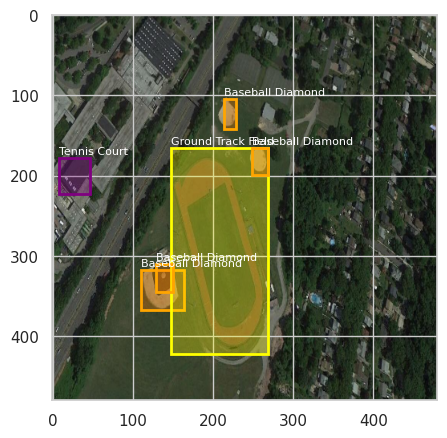

Image 92:
Predicted number of boxes: 100
Predicted labels: [10, 10, 10, 10, 5, 10, 10, 10, 1, 5, 10, 10, 10, 4, 4, 5, 4, 10, 2, 10, 5, 10, 4, 10, 10, 4, 10, 4, 4, 4, 1, 5, 5, 10, 1, 5, 5, 5, 10, 4, 10, 1, 1, 5, 2, 2, 4, 10, 10, 4, 2, 5, 4, 2, 10, 10, 5, 10, 4, 1, 10, 5, 4, 2, 1, 5, 5, 1, 4, 10, 10, 5, 10, 1, 2, 5, 1, 10, 4, 10, 5, 7, 5, 5, 10, 4, 5, 7, 10, 2, 10, 1, 5, 7, 2, 4, 7, 1, 5, 4]


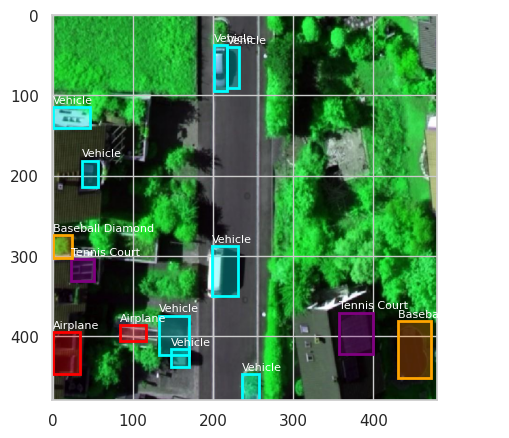

Image 60:
Predicted number of boxes: 100
Predicted labels: [4, 4, 4, 4, 4, 4, 4, 4, 5, 4, 4, 4, 3, 5, 4, 3, 4, 7, 7, 5, 1, 10, 7, 5, 10, 5, 6, 10, 5, 10, 1, 7, 10, 3, 3, 10, 1, 6, 5, 7, 1, 5, 3, 10, 7, 3, 1, 5, 7, 10, 6, 5, 1, 3, 10, 10, 2, 6, 3, 6, 6, 4, 5, 6, 3, 4, 10, 7, 4, 3, 6, 1, 2, 7, 6, 4, 6, 5, 1, 1, 1, 4, 7, 2, 4, 2, 2, 3, 3, 1, 6, 8, 7, 4, 5, 7, 7, 7, 3, 8]


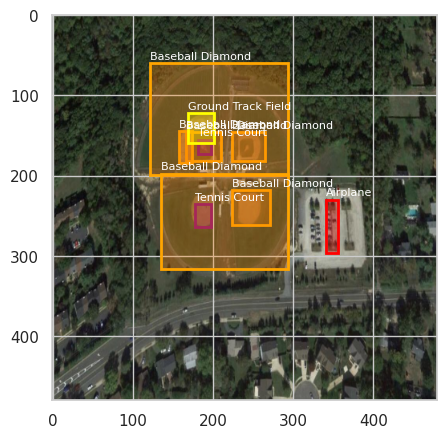

Image 55:
Predicted number of boxes: 100
Predicted labels: [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 5, 5, 3, 10, 5, 5, 1, 10, 1, 4, 5, 10, 5, 5, 1, 5, 4, 1, 5, 1, 3, 10, 3, 10, 3, 3, 5, 5, 5, 4, 5, 5, 5, 1, 5, 10, 7, 5, 10, 1, 3, 10, 5, 5, 1, 5, 5, 3, 1, 5, 10, 2, 1, 3, 3, 2, 10, 3, 10, 10, 5, 7, 5, 5, 4, 5, 5, 5, 10, 5]


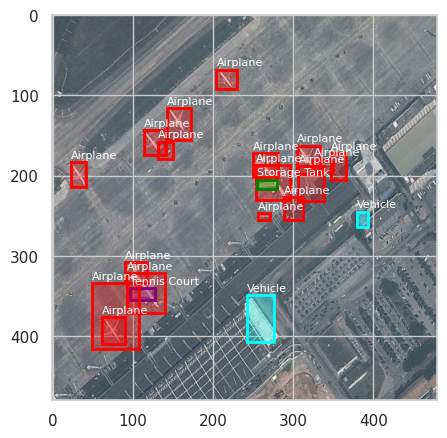

In [ ]:
random_indices = random.sample(range(len(evaluation_dataset)), 5)


model.eval()
with torch.no_grad():
    for idx in random_indices:

        test_img, test_target = evaluation_dataset[idx]

        test_img_pil = torch_to_pil(test_img)


        prediction = model([test_img.to(device)])[0]


        print(f'Image {idx + 1}:')
        print('Predicted number of boxes:', len(prediction['boxes']))
        print('Predicted labels:', prediction['labels'].tolist())


        filtered_prediction = filter_overlapping_boxes(prediction, iou_thresh=0.2)


        display_image_with_bbox(test_img_pil, filtered_prediction)

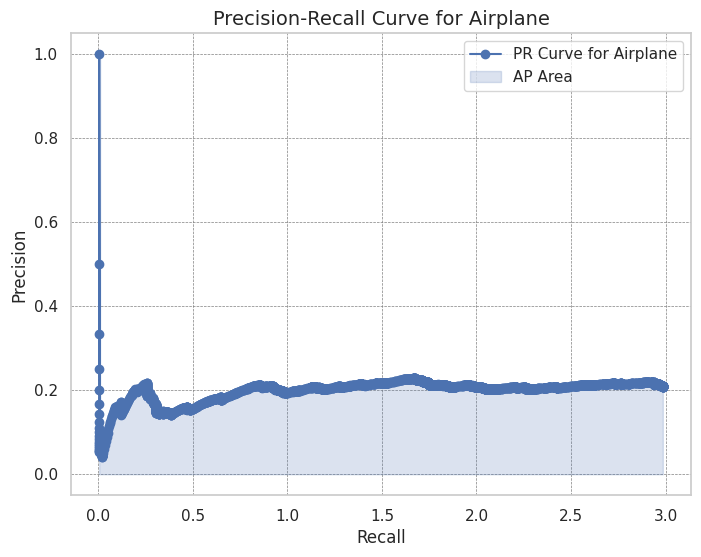

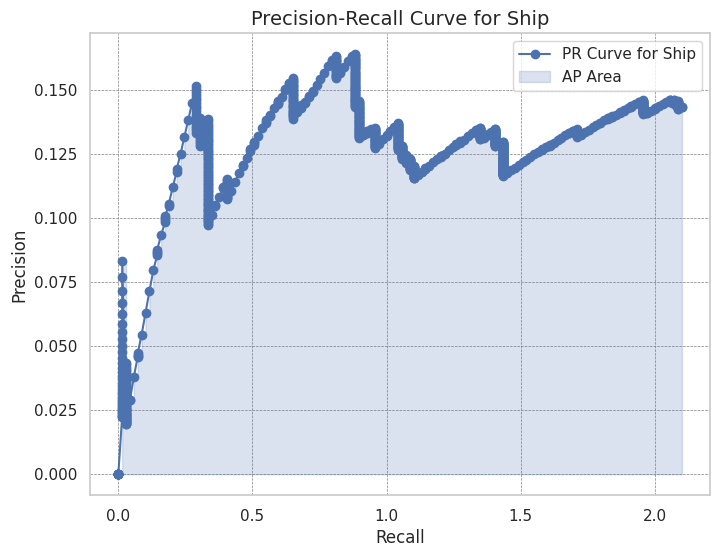

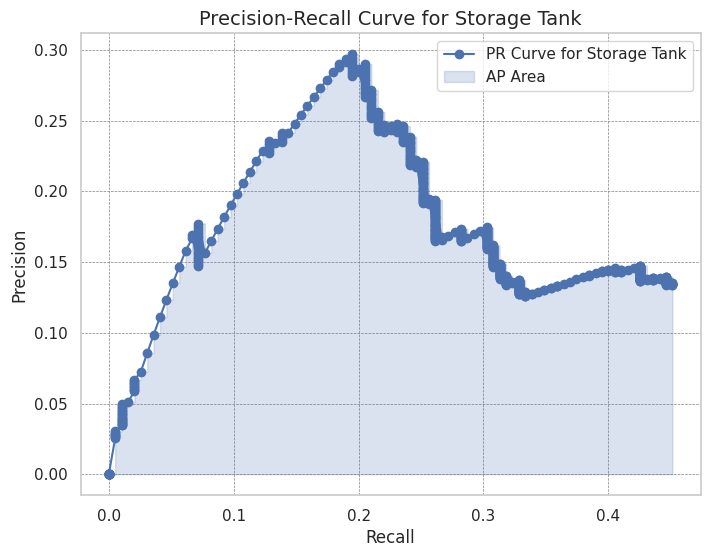

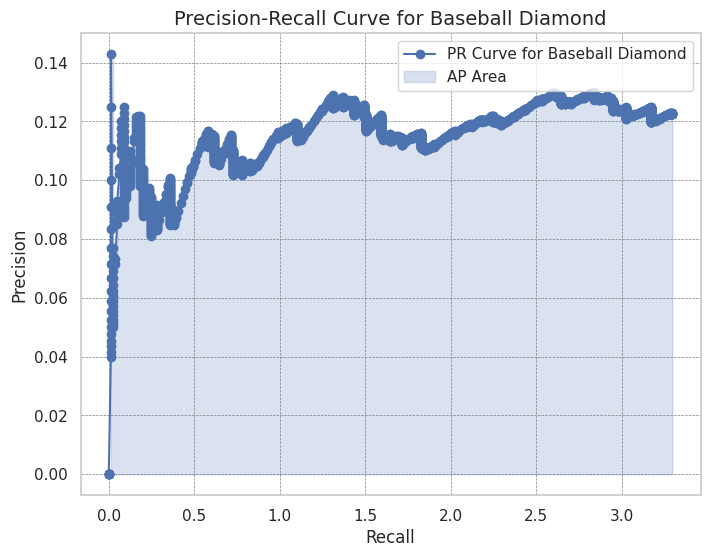

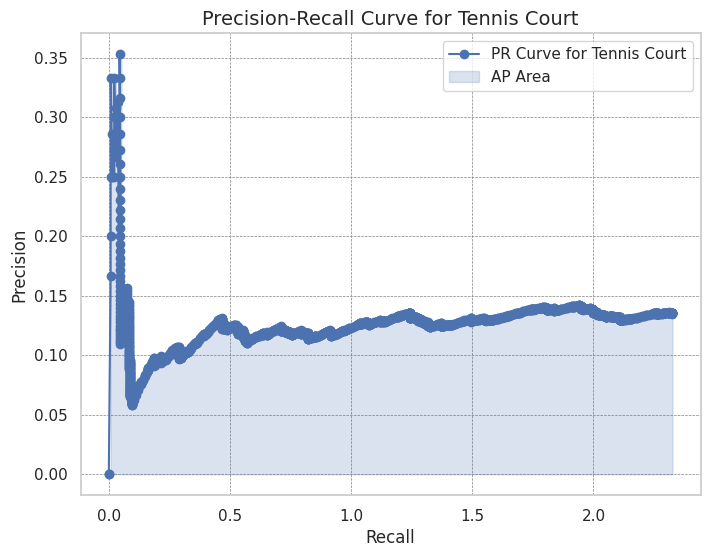

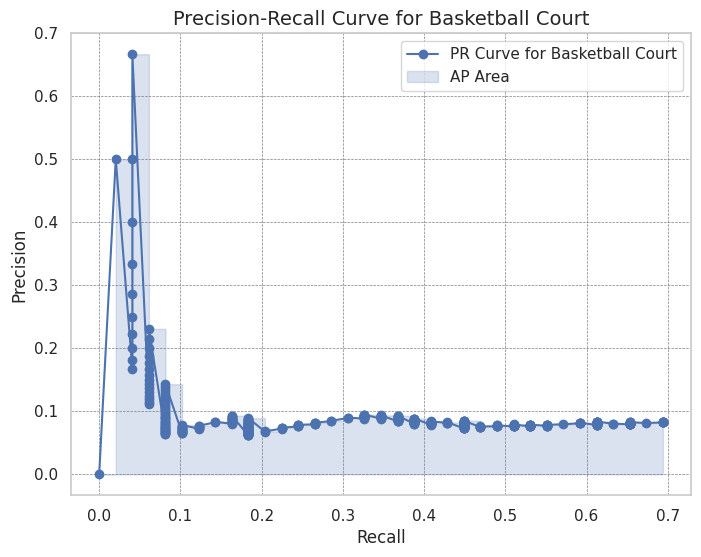

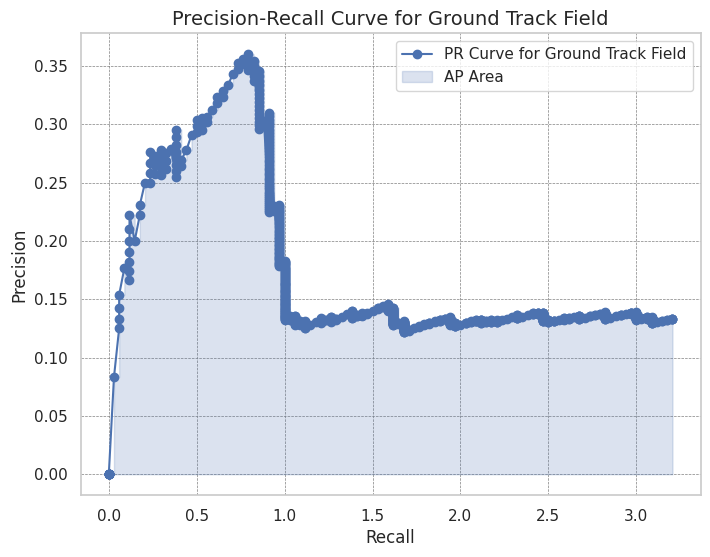

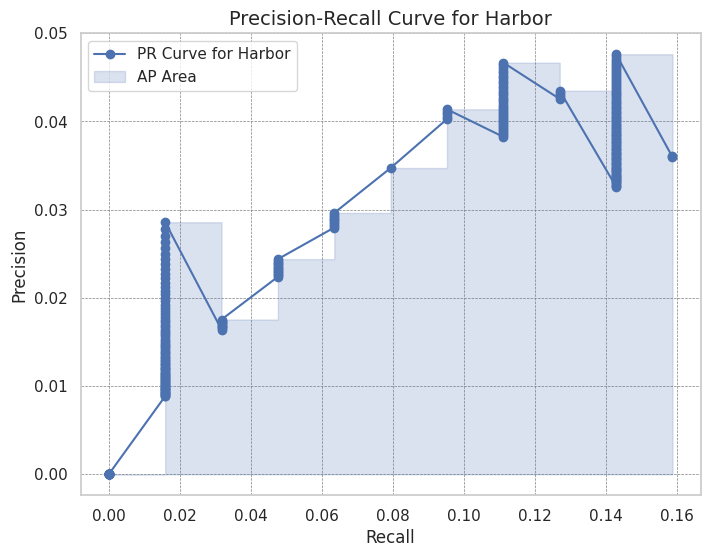

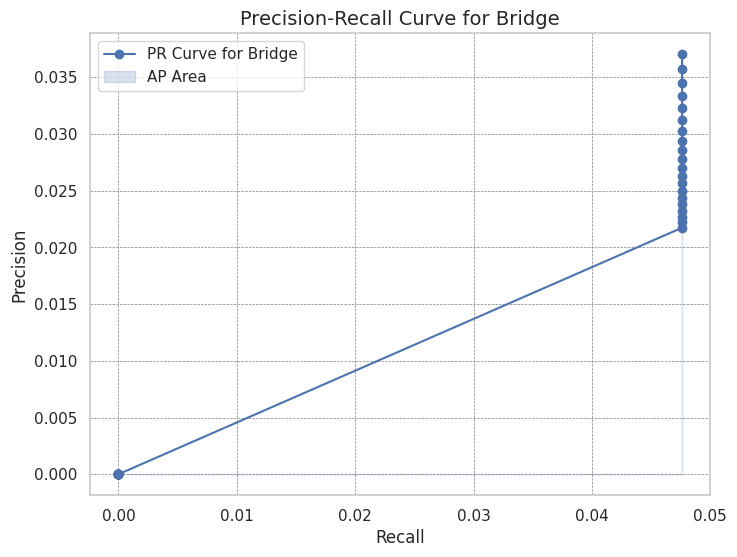

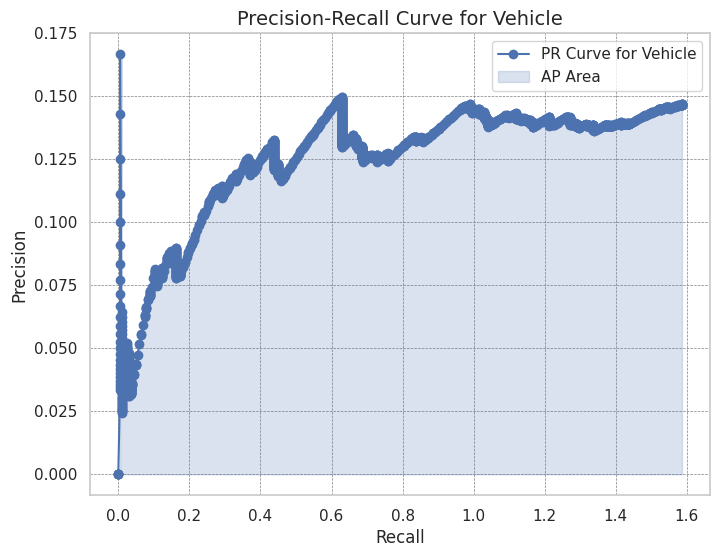

In [ ]:
targets = [target for _, target in evaluation_dataset]
predictions = []

with torch.no_grad():
    for img, _ in evaluation_dataset:
        prediction = model([img.to(device)])[0]
        predictions.append(prediction)

object_categories = {
    1: 'Airplane',
    2: 'Ship',
    3: 'Storage Tank',
    4: 'Baseball Diamond',
    5: 'Tennis Court',
    6: 'Basketball Court',
    7: 'Ground Track Field',
    8: 'Harbor',
    9: 'Bridge',
    10: 'Vehicle'
}


plot_pr_curves_by_class(targets, predictions, object_categories)


### **Hybrid technique: Adam_SGD**

In [ ]:
from torch.optim import Adam, SGD
from torch.optim.lr_scheduler import StepLR

num_epochs = 10
switch_epoch = num_epochs //2


model = create_detection_model(num_classes)
model.to(device)


params = [p for p in model.parameters() if p.requires_grad]


optimizer_adam = Adam(params, lr=0.0001, betas=(0.9, 0.999), weight_decay=0.0001)
optimizer_sgd = SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)


optimizer = optimizer_adam


lr_scheduler = StepLR(optimizer, step_size=3, gamma=0.1)


for epoch in range(num_epochs):
    if epoch == switch_epoch:
        optimizer = optimizer_sgd
        lr_scheduler = StepLR(optimizer, step_size=3, gamma=0.1)

    train_one_epoch(model, optimizer, training_data_loader, device, epoch, print_freq=10)
    lr_scheduler.step()


Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:01<00:00, 100MB/s] 


Epoch: [0]  [ 0/50]  eta: 0:07:27  lr: 0.000002  loss: 2.6238 (2.6238)  loss_classifier: 2.0591 (2.0591)  loss_box_reg: 0.2671 (0.2671)  loss_objectness: 0.2780 (0.2780)  loss_rpn_box_reg: 0.0197 (0.0197)  time: 8.9497  data: 4.6564  max mem: 8221
Epoch: [0]  [10/50]  eta: 0:01:34  lr: 0.000023  loss: 2.3160 (2.2223)  loss_classifier: 1.8134 (1.6638)  loss_box_reg: 0.2671 (0.2542)  loss_objectness: 0.2780 (0.2795)  loss_rpn_box_reg: 0.0223 (0.0247)  time: 2.3542  data: 0.4586  max mem: 8537
Epoch: [0]  [20/50]  eta: 0:01:01  lr: 0.000043  loss: 1.3132 (1.6837)  loss_classifier: 0.8429 (1.1510)  loss_box_reg: 0.3118 (0.3266)  loss_objectness: 0.1088 (0.1839)  loss_rpn_box_reg: 0.0215 (0.0221)  time: 1.7053  data: 0.0383  max mem: 8537
Epoch: [0]  [30/50]  eta: 0:00:38  lr: 0.000063  loss: 0.9793 (1.4283)  loss_classifier: 0.4961 (0.9239)  loss_box_reg: 0.3586 (0.3394)  loss_objectness: 0.0650 (0.1451)  loss_rpn_box_reg: 0.0139 (0.0199)  time: 1.7194  data: 0.0366  max mem: 8538
Epoch: [

In [ ]:
evaluate(model, test_data_loader, device=device)

creating index...
index created!
Test:  [ 0/15]  eta: 0:00:32  model_time: 0.9291 (0.9291)  evaluator_time: 0.0324 (0.0324)  time: 2.1815  data: 1.2022  max mem: 8696
Test:  [14/15]  eta: 0:00:00  model_time: 0.7703 (0.7763)  evaluator_time: 0.0288 (0.0418)  time: 0.9618  data: 0.1327  max mem: 8696
Test: Total time: 0:00:14 (0.9677 s / it)
Averaged stats: model_time: 0.7703 (0.7763)  evaluator_time: 0.0288 (0.0418)
Accumulating evaluation results...
DONE (t=0.08s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.510
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.905
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.503
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.396
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.501
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.562
 Average Recall     (AR) @[ IoU=

Image 29:
Predicted number of boxes: 21
Predicted labels: [8, 8, 8, 8, 2, 8, 2, 8, 2, 2, 8, 8, 2, 2, 8, 1, 10, 8, 1, 1, 9]


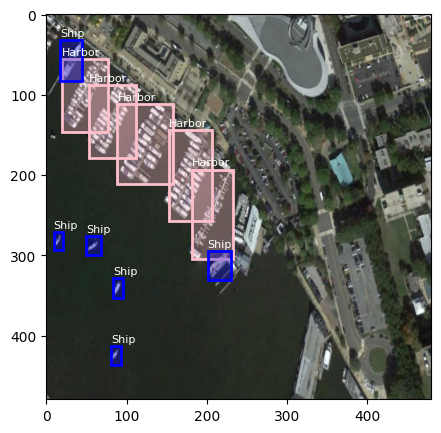

Image 79:
Predicted number of boxes: 28
Predicted labels: [8, 8, 8, 2, 8, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 8, 2, 8, 8, 2, 2, 2, 8, 2, 2, 2, 2, 8]


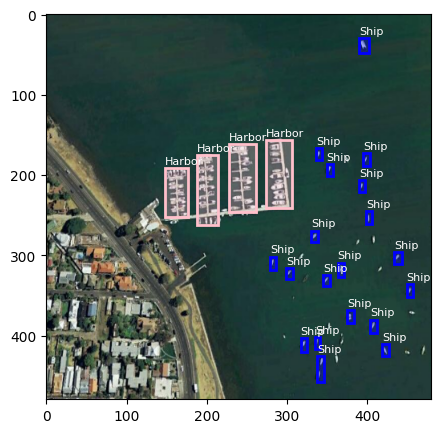

Image 8:
Predicted number of boxes: 2
Predicted labels: [7, 6]


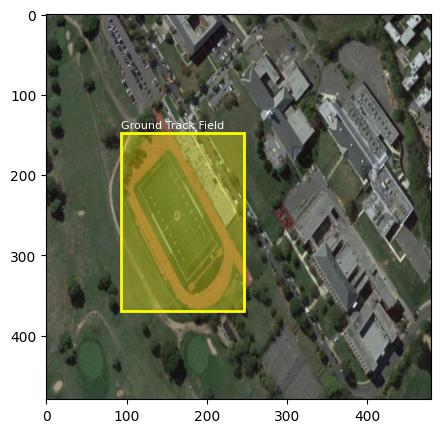

Image 127:
Predicted number of boxes: 8
Predicted labels: [10, 10, 10, 10, 10, 10, 5, 10]


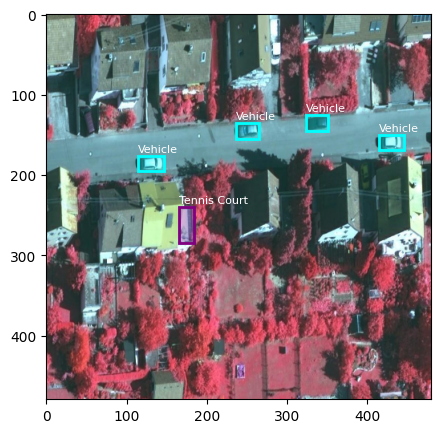

Image 27:
Predicted number of boxes: 6
Predicted labels: [4, 4, 4, 4, 4, 7]


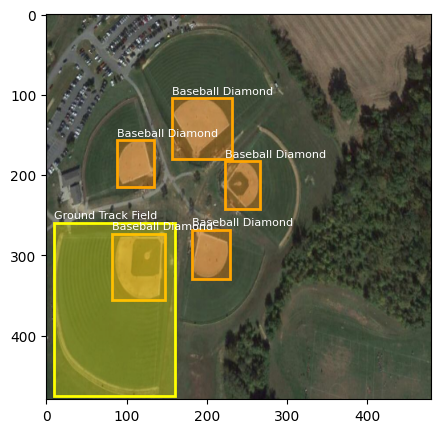

In [ ]:
random_indices = random.sample(range(len(evaluation_dataset)), 5)


model.eval()
with torch.no_grad():
    for idx in random_indices:

        test_img, test_target = evaluation_dataset[idx]

        test_img_pil = torch_to_pil(test_img)


        prediction = model([test_img.to(device)])[0]


        print(f'Image {idx + 1}:')
        print('Predicted number of boxes:', len(prediction['boxes']))
        print('Predicted labels:', prediction['labels'].tolist())


        filtered_prediction = filter_overlapping_boxes(prediction, iou_thresh=0.2)


        display_image_with_bbox(test_img_pil, filtered_prediction)

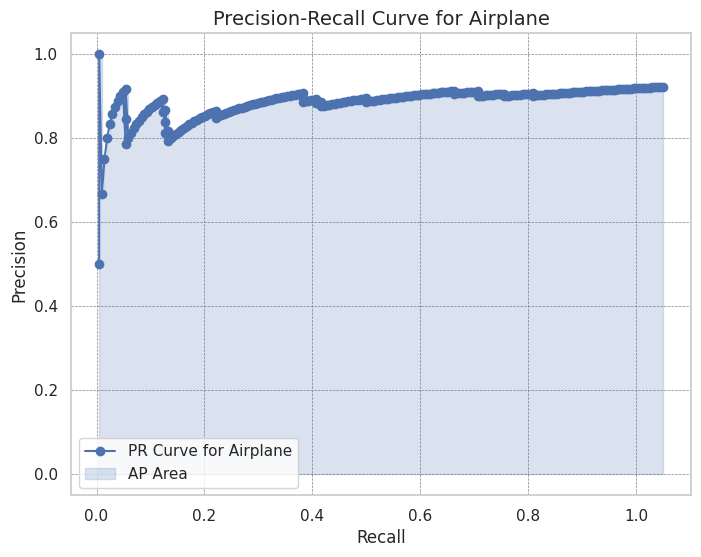

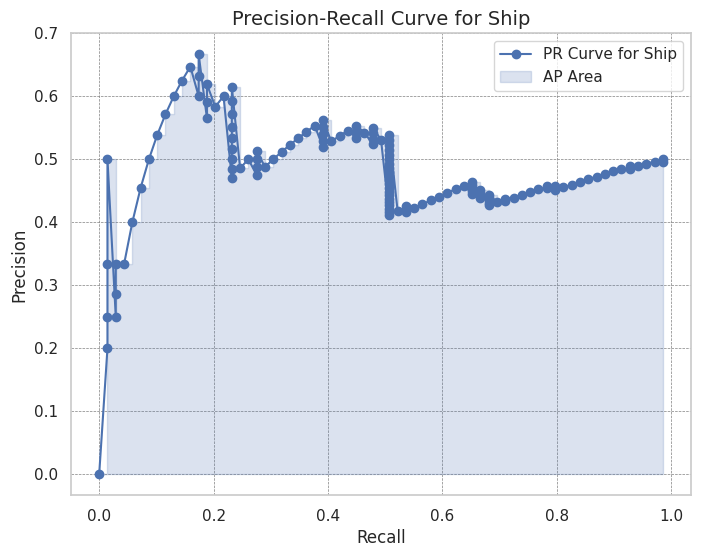

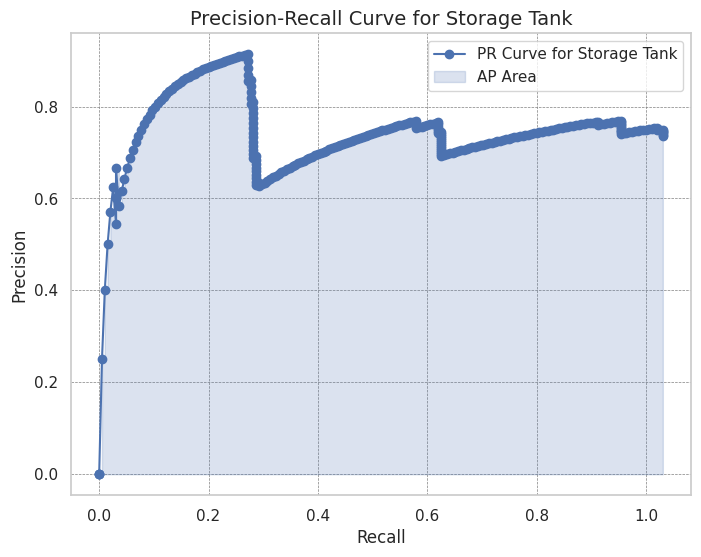

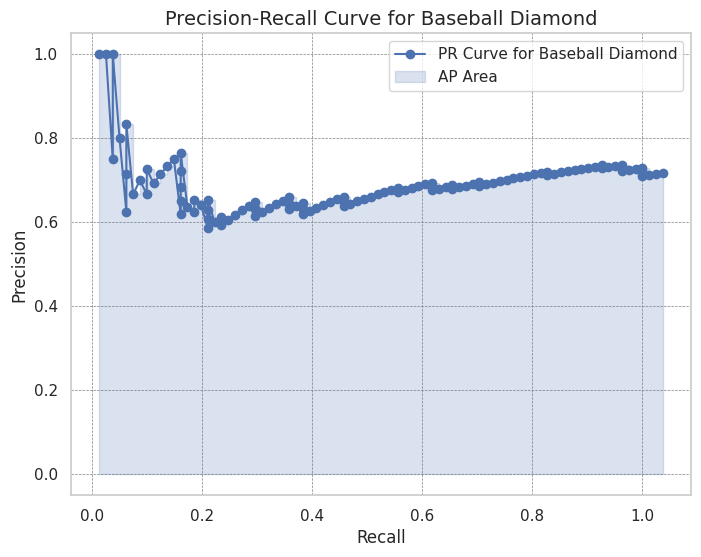

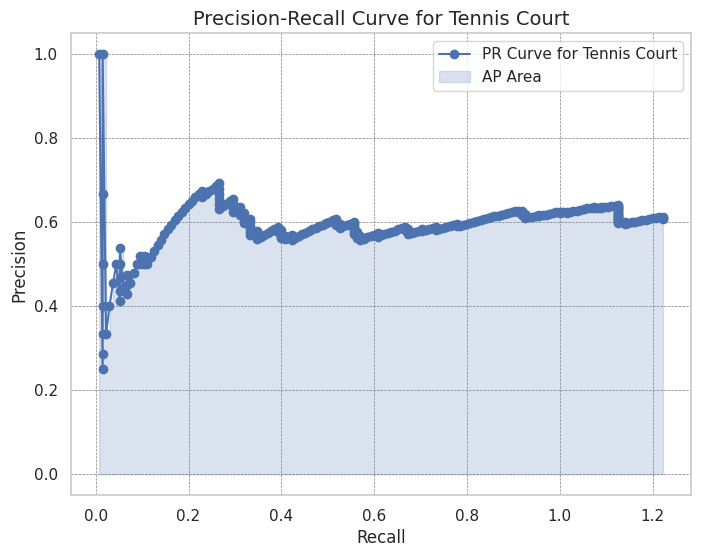

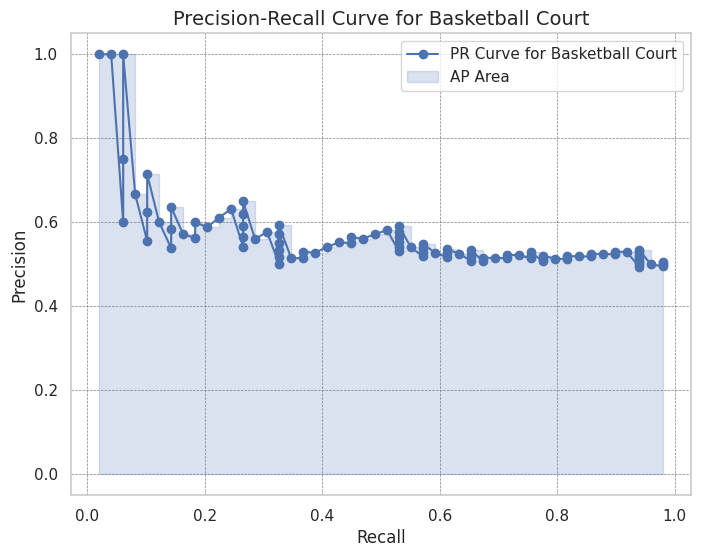

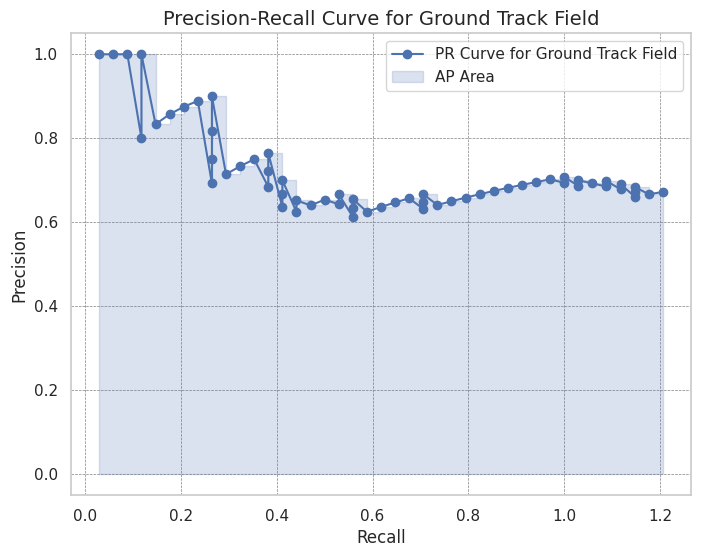

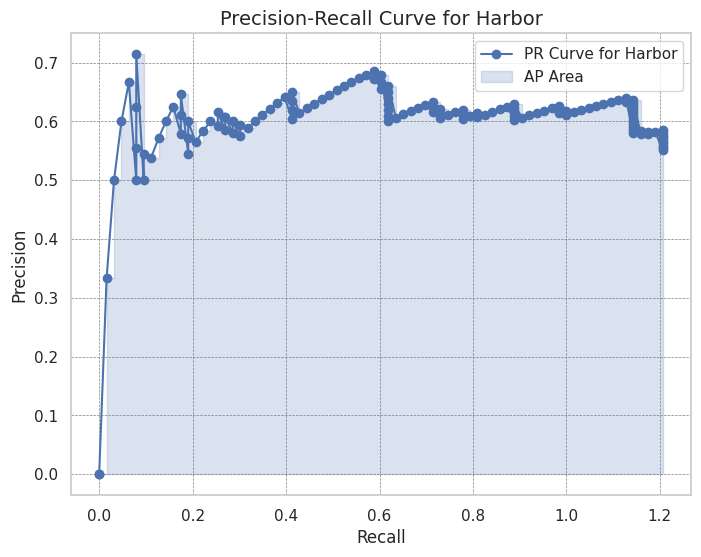

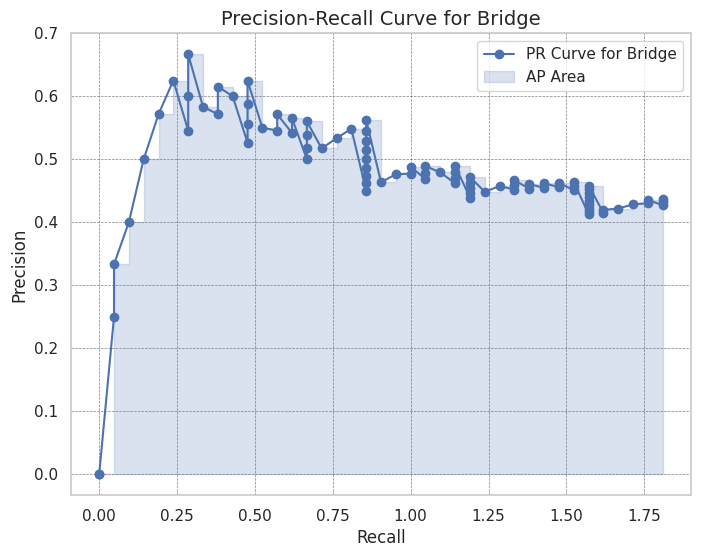

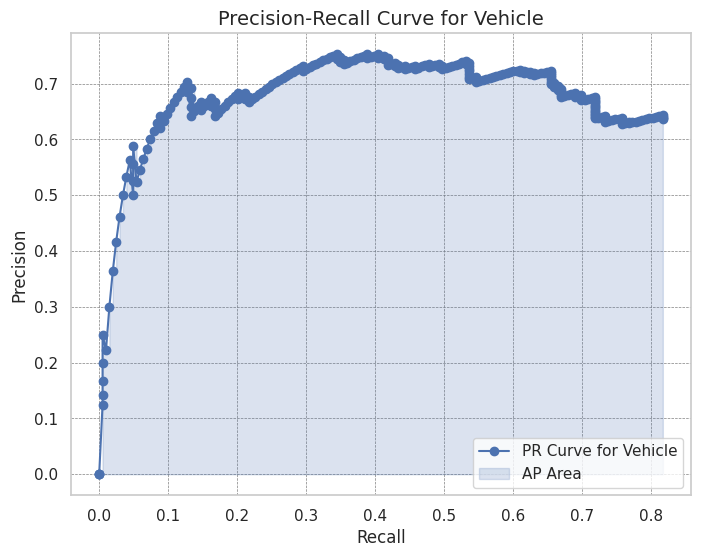

In [ ]:
targets = [target for _, target in evaluation_dataset]
predictions = []

with torch.no_grad():
    for img, _ in evaluation_dataset:
        prediction = model([img.to(device)])[0]
        predictions.append(prediction)

object_categories = {
    1: 'Airplane',
    2: 'Ship',
    3: 'Storage Tank',
    4: 'Baseball Diamond',
    5: 'Tennis Court',
    6: 'Basketball Court',
    7: 'Ground Track Field',
    8: 'Harbor',
    9: 'Bridge',
    10: 'Vehicle'
}


plot_pr_curves_by_class(targets, predictions, object_categories)


### **Hybrid technique: SGD_Adam**

In [ ]:

num_epochs = 10
switch_epoch = num_epochs


model = create_detection_model(num_classes)
model.to(device)


params = [p for p in model.parameters() if p.requires_grad]


optimizer_sgd = SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)
optimizer_adam = Adam(params, lr=0.0001, betas=(0.9, 0.999), weight_decay=0.0001)


optimizer = optimizer_sgd


lr_scheduler = StepLR(optimizer, step_size=3, gamma=0.1)


for epoch in range(num_epochs):
    if epoch == switch_epoch:
        optimizer = optimizer_adam
        lr_scheduler = StepLR(optimizer, step_size=3, gamma=0.1)

    train_one_epoch(model, optimizer, training_data_loader, device, epoch, print_freq=10)
    lr_scheduler.step()


Epoch: [0]  [ 0/50]  eta: 0:03:18  lr: 0.000107  loss: 3.4847 (3.4847)  loss_classifier: 2.9209 (2.9209)  loss_box_reg: 0.2192 (0.2192)  loss_objectness: 0.3147 (0.3147)  loss_rpn_box_reg: 0.0300 (0.0300)  time: 3.9797  data: 1.9054  max mem: 8696
Epoch: [0]  [10/50]  eta: 0:01:17  lr: 0.001126  loss: 2.4778 (2.4178)  loss_classifier: 1.9461 (1.8233)  loss_box_reg: 0.2590 (0.2788)  loss_objectness: 0.2043 (0.2912)  loss_rpn_box_reg: 0.0247 (0.0244)  time: 1.9361  data: 0.2044  max mem: 8696
Epoch: [0]  [20/50]  eta: 0:00:55  lr: 0.002146  loss: 1.2573 (1.8095)  loss_classifier: 0.6834 (1.2762)  loss_box_reg: 0.2954 (0.3129)  loss_objectness: 0.1087 (0.1993)  loss_rpn_box_reg: 0.0181 (0.0211)  time: 1.7427  data: 0.0350  max mem: 8696
Epoch: [0]  [30/50]  eta: 0:00:36  lr: 0.003165  loss: 0.9554 (1.5278)  loss_classifier: 0.4796 (1.0145)  loss_box_reg: 0.3584 (0.3382)  loss_objectness: 0.0788 (0.1552)  loss_rpn_box_reg: 0.0140 (0.0199)  time: 1.7633  data: 0.0368  max mem: 8696
Epoch: [

In [ ]:
evaluate(model, test_data_loader, device=device)

creating index...
index created!
Test:  [ 0/15]  eta: 0:00:40  model_time: 1.0538 (1.0538)  evaluator_time: 0.0750 (0.0750)  time: 2.7033  data: 1.5471  max mem: 8696
Test:  [14/15]  eta: 0:00:01  model_time: 0.7954 (0.8119)  evaluator_time: 0.0409 (0.0515)  time: 1.0085  data: 0.1336  max mem: 8696
Test: Total time: 0:00:15 (1.0185 s / it)
Averaged stats: model_time: 0.7954 (0.8119)  evaluator_time: 0.0409 (0.0515)
Accumulating evaluation results...
DONE (t=0.21s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.470
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.845
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.477
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.376
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.451
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.480
 Average Recall     (AR) @[ IoU=

Image 130:
Predicted number of boxes: 35
Predicted labels: [10, 10, 5, 10, 6, 6, 10, 5, 10, 10, 5, 5, 5, 10, 10, 8, 5, 5, 6, 7, 7, 5, 8, 8, 6, 6, 10, 6, 6, 9, 8, 8, 9, 9, 6]


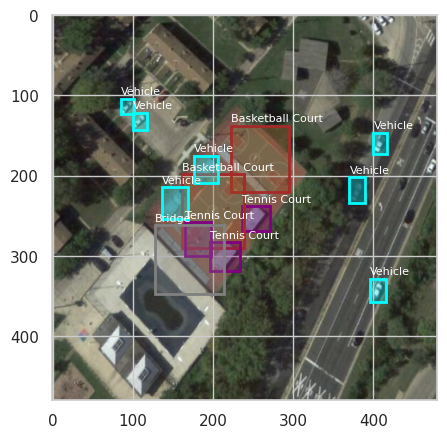

Image 98:
Predicted number of boxes: 36
Predicted labels: [4, 9, 9, 9, 9, 9, 10, 9, 7, 9, 7, 9, 9, 9, 7, 7, 9, 9, 9, 8, 8, 9, 9, 8, 6, 8, 2, 9, 8, 9, 2, 1, 1, 3, 6, 6]


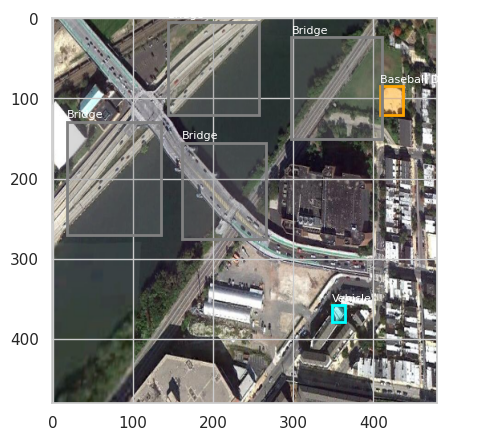

Image 63:
Predicted number of boxes: 23
Predicted labels: [1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 1, 7, 7, 9, 1, 1, 8, 6, 9, 9, 9, 7, 9]


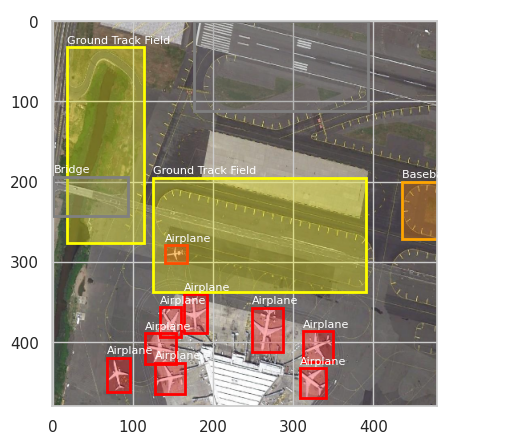

Image 138:
Predicted number of boxes: 13
Predicted labels: [7, 4, 10, 10, 5, 6, 6, 5, 9, 5, 8, 9, 6]


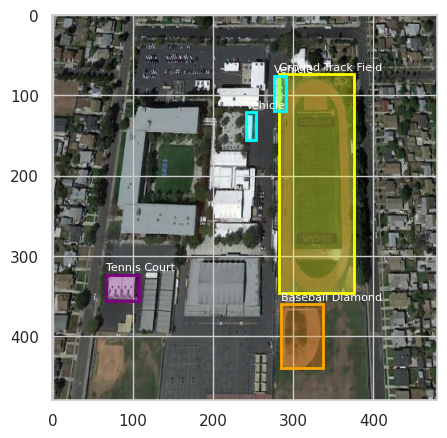

Image 133:
Predicted number of boxes: 64
Predicted labels: [8, 8, 2, 8, 2, 5, 8, 8, 2, 8, 8, 2, 8, 8, 10, 8, 8, 1, 8, 8, 5, 9, 8, 8, 1, 1, 6, 10, 8, 9, 1, 7, 8, 9, 8, 9, 2, 9, 8, 8, 5, 9, 2, 8, 8, 9, 9, 9, 9, 9, 1, 8, 9, 8, 9, 9, 8, 9, 9, 9, 7, 2, 9, 6]


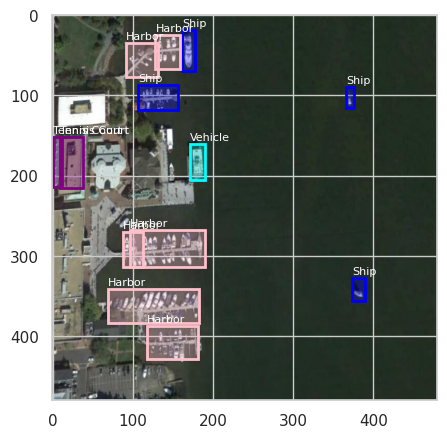

In [ ]:
random_indices = random.sample(range(len(evaluation_dataset)), 5)


model.eval()
with torch.no_grad():
    for idx in random_indices:

        test_img, test_target = evaluation_dataset[idx]

        test_img_pil = torch_to_pil(test_img)


        prediction = model([test_img.to(device)])[0]


        print(f'Image {idx + 1}:')
        print('Predicted number of boxes:', len(prediction['boxes']))
        print('Predicted labels:', prediction['labels'].tolist())


        filtered_prediction = filter_overlapping_boxes(prediction, iou_thresh=0.2)


        display_image_with_bbox(test_img_pil, filtered_prediction)

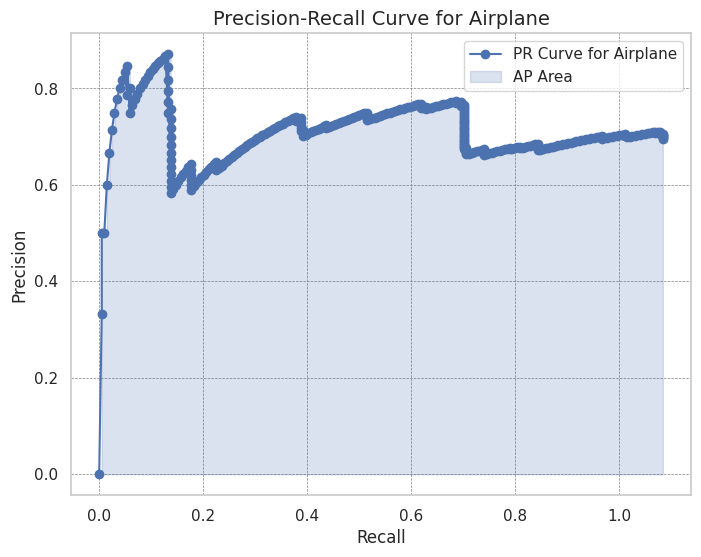

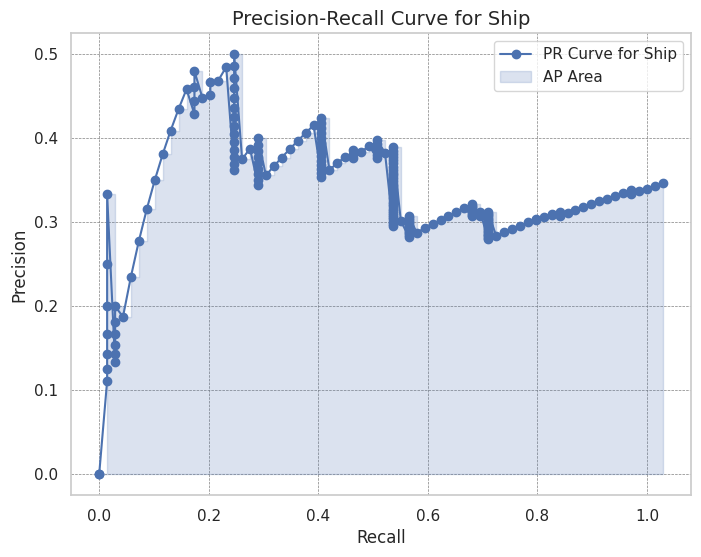

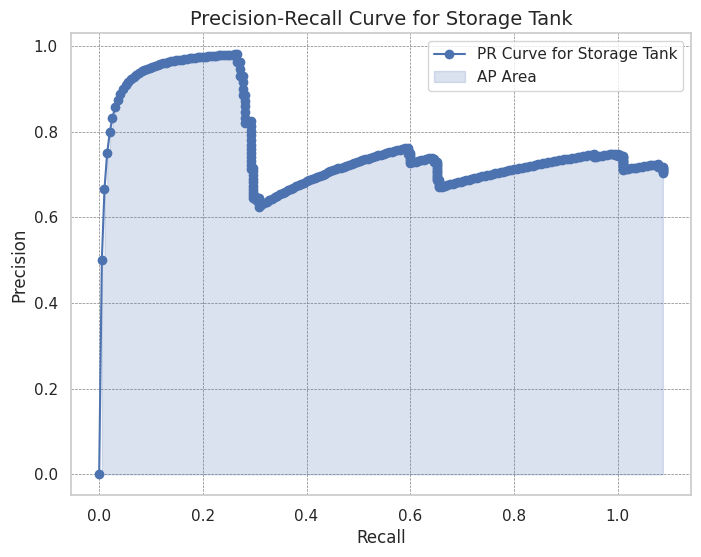

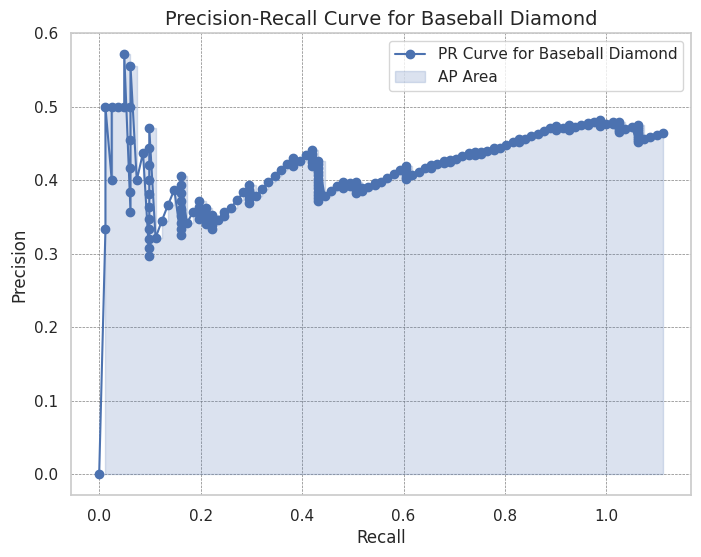

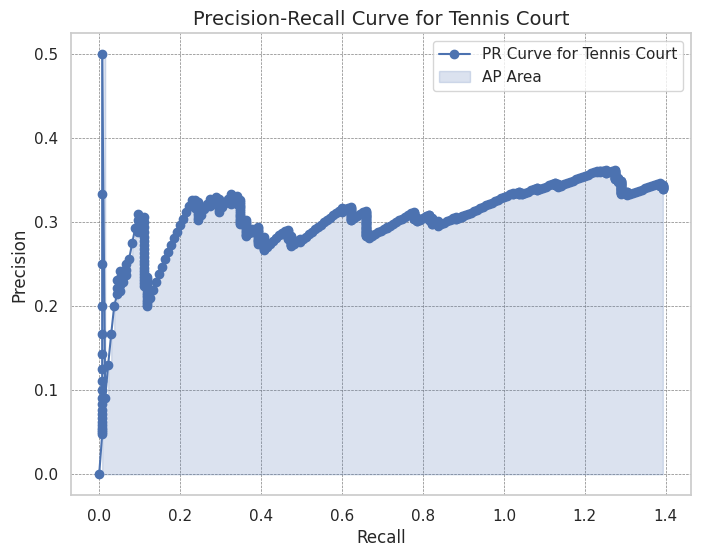

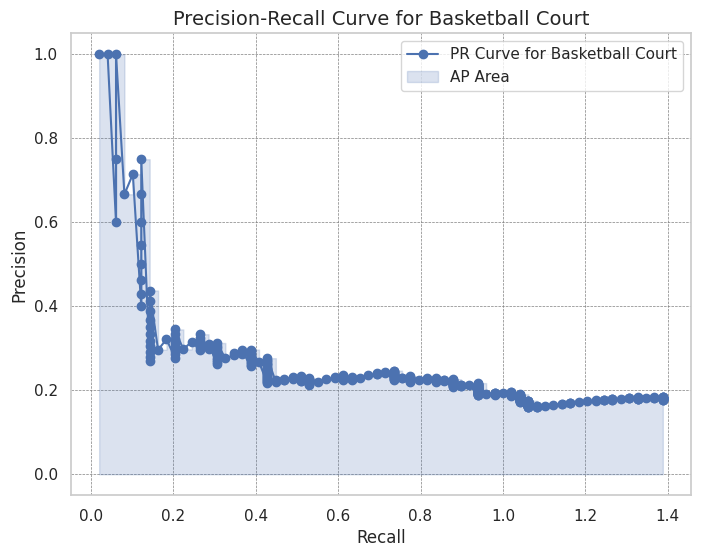

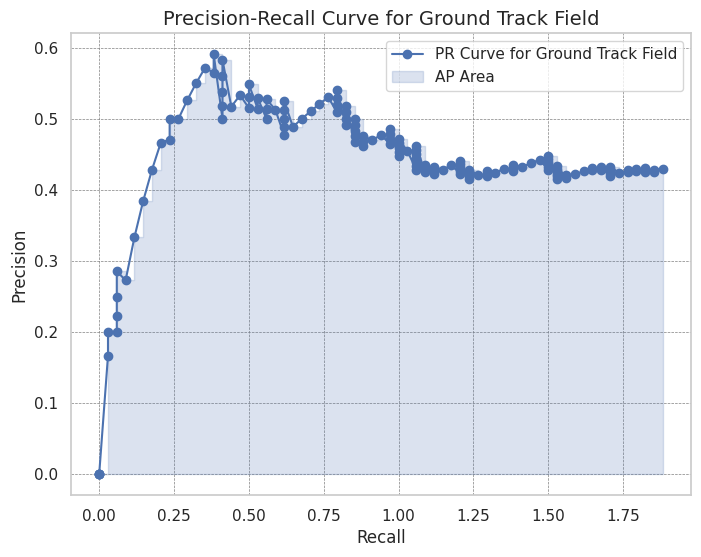

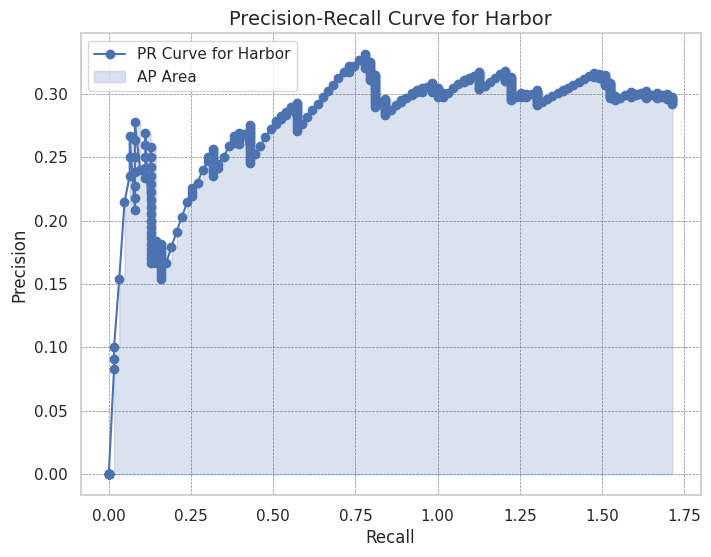

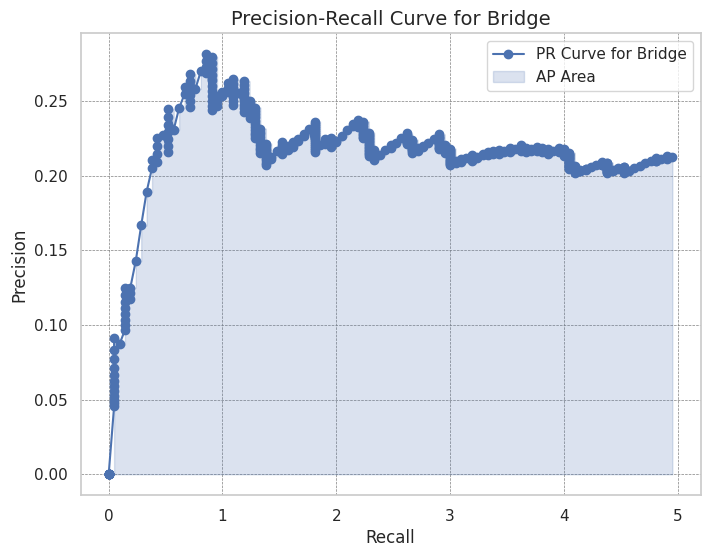

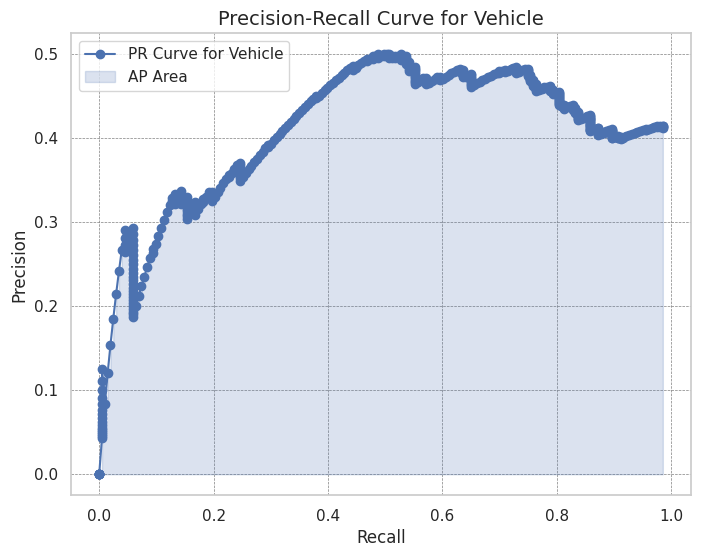

In [ ]:
targets = [target for _, target in evaluation_dataset]
predictions = []

with torch.no_grad():
    for img, _ in evaluation_dataset:
        prediction = model([img.to(device)])[0]
        predictions.append(prediction)

object_categories = {
    1: 'Airplane',
    2: 'Ship',
    3: 'Storage Tank',
    4: 'Baseball Diamond',
    5: 'Tennis Court',
    6: 'Basketball Court',
    7: 'Ground Track Field',
    8: 'Harbor',
    9: 'Bridge',
    10: 'Vehicle'
}


plot_pr_curves_by_class(targets, predictions, object_categories)
